## 📝Создаем ONNX файл

In [96]:
#@title 🌌Подготовка окружения

# Обновление и установка базовых инструментов
!apt-get update -qq
!apt-get install -y python3-pip ffmpeg -qq

# Удаление существующего numpy и установка фиксированной версии
!pip uninstall numpy -y -q
!pip install numpy==1.26.4 torch==2.2.1+cpu torchaudio==2.2.1+cpu torchvision==0.17.1+cpu hydra-core==1.3.2 omegaconf==2.3.0 onnxruntime==1.17.3 tqdm==4.67.1 git+https://github.com/salute-developers/GigaAM.git -f https://download.pytorch.org/whl/torch_stable.html --no-cache-dir

# Немедленный импорт numpy для фиксации версии
import numpy as np
print(f"NumPy version after initial install: {np.__version__}")

# !pip install pyannote.audio --no-deps --no-cache-dir -q  # Без зависимостей, чтобы не перезаписать numpy
import numpy as np
print(f"NumPy after torch install: {np.__version__}")

# Импорт библиотек
import os
import sys
import shutil
import warnings
import logging
from pathlib import Path
from subprocess import CalledProcessError, run
from typing import Dict, List, Optional, Tuple, Union, Type
import urllib.request

try:
    import onnxruntime as rt
    print("onnxruntime успешно импортирован!")
except ImportError:
    print("Не удалось импортировать onnxruntime")

try:
    import hydra
    print("Hydra успешно импортирована!")
except ImportError:
    print("Не удалось импортировать Hydra")

import numpy as np
print(f"NumPy version after pyannote install 1: {np.__version__}")

# Проверка версий
import torch
import torchvision
import omegaconf
from torch import Tensor
from torch.jit import TracerWarning
import torch.nn as nn
import torch.nn.functional as F
import torchaudio
from tqdm import tqdm
print("Torch version:", torch.__version__)
print("Torchaudio version:", torchaudio.__version__)
print("Hydra version:", hydra.__version__)
print("Omegaconf version:", omegaconf.__version__)
print("Numpy version:", np.__version__)
# print("tqdm version:", tqdm.__version__)
print("onnxruntime version:", rt.__version__)
print("torchvision version:", torchvision.__version__)

import numpy as np
print(f"NumPy version after pyannote install 2: {np.__version__}")
# Установка совместимой версии transformers
# !pip install transformers==4.39.3 --no-cache-dir -q

# # Установка pyannote.audio без перезаписи зависимостей
# !pip install pyannote.audio==3.1.1 --no-deps --no-cache-dir -q

# # Установка минимальных зависимостей pyannote.audio вручную
# !pip install pyannote.core==5.0.0 pyannote.database==5.0.1 pyannote.metrics==3.2.1 pyannote.pipeline==3.0.1 --no-cache-dir -q
# !pip install speechbrain==0.5.16 torchmetrics==0.11.4 pytorch-metric-learning==2.3.0 --no-cache-dir -q
# import numpy as np
print(f"NumPy version after pyannote install 3: {np.__version__}")
# from pyannote.audio import Pipeline
from pydub import AudioSegment
from io import BytesIO
from sentencepiece import SentencePieceProcessor

# Проверка совместимости NumPy и PyTorch
try:
    a = torch.randn(5).cpu()
    b = a.numpy()
    print("NumPy is working fine with PyTorch!")
except Exception as e:
    print("NumPy is not working correctly:", e)

# Если всё успешно, перезапустите runtime
print("Если всё работает, перезапустите runtime (Runtime -> Restart runtime) и выполните ячейку снова для проверки.")

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
^C
Looking in links: https://download.pytorch.org/whl/torch_stable.html
  Cloning https://github.com/salute-developers/GigaAM.git to /tmp/pip-req-build-eehcdbuq
  Running command git clone --filter=blob:none --quiet https://github.com/salute-developers/GigaAM.git /tmp/pip-req-build-eehcdbuq
  Resolved https://github.com/salute-developers/GigaAM.git to commit 2dfdad6195286784b496e6ec8d08e4de3b07313b
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 153.4 MB/s eta 0:00:00
NumPy version after initial install: 1.26.4
NumPy after torch install: 1.26.4
onnxruntime успешно импортирован!
Hydra успешно импортирована!
NumPy version after pyannote install 1: 1.26.4
Torch version: 2.2.1

In [97]:
# Проверяем версию NumPy (должна быть 1.26.4 - ниже второй)
import numpy as np
print(f"NumPy version: {np.__version__}")

# Проверяем установленные пакеты
!pip list

NumPy version: 1.26.4
Package                            Version
---------------------------------- -------------------
absl-py                            1.4.0
accelerate                         1.5.2
aiohappyeyeballs                   2.6.1
aiohttp                            3.11.14
aiosignal                          1.3.2
alabaster                          1.0.0
albucore                           0.0.23
albumentations                     2.0.5
ale-py                             0.10.2
altair                             5.5.0
annotated-types                    0.7.0
antlr4-python3-runtime             4.9.3
anyio                              4.9.0
argon2-cffi                        23.1.0
argon2-cffi-bindings               21.2.0
array_record                       0.7.1
arviz                              0.21.0
astropy                            7.0.1
astropy-iers-data                  0.2025.3.17.0.34.53
astunparse                         1.6.3
atpublic                           5.1


In [98]:
# Монтирование Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Путь к аудиофайлу
source_path = '/content/drive/MyDrive/-ot-vinta-bass-bossted.wav'
if not os.path.exists(source_path):
    raise FileNotFoundError(f"Файл не найден по пути: {source_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [99]:
from dataclasses import dataclass, field
from typing import Dict, List, Optional, Tuple, Union, Type
# Инициализация глобальных параметров
@dataclass(frozen=True)
class Constants:
      _URL_DIR: str = "https://cdn.chatwm.opensmodel.sberdevices.ru/GigaAM"
      BLANK_IDX: int = 33  # Индекс пустого токена
      D_MODEL: int = 768
      DTYPE: Type[np.dtype] = np.float32
      MAX_LETTERS_PER_FRAME: int = 3
      FEAT_IN: int = 64
      PRED_HIDDEN: int = 320
      SAMPLE_RATE: int = 16000
      LONGFORM_THRESHOLD: int = 25 * SAMPLE_RATE
      # Параметры
      N_FFT_TEST: int = SAMPLE_RATE // 40
      N_MELS_TEST: int = 64
      N_MFCC_TEST: int = 64
      N_LFCC_TEST: int = 64
      HOP_LENGTH_TEST: int = SAMPLE_RATE // 100
      WIN_LENGTH_TEST: int = SAMPLE_RATE // 40
      MIN_LOG_TOLERANCE: float = 1e-9
      MAX_LOG_TOLERANCE: float = 1e9

MY_CONSTANTS = Constants()

# List букв русского языка
VOCAB = [
    " ", "а", "б", "в", "г", "д", "е", "ж", "з", "и", "й", "к", "л", "м", "н", "о",
    "п", "р", "с", "т", "у", "ф", "х", "ц", "ч", "ш", "щ", "ъ", "ы", "ь", "э", "ю", "я"
]
print("VOCAB size:", len(VOCAB))

# Список моделей (отсюда нам нужна v2_ctc)
_MODEL_NAMES = [
    "ctc",
    "rnnt",
    "ssl",
    "emo",
    "v1_ctc",
    "v1_rnnt",
    "v1_ssl",
    "v2_ctc",
    "v2_rnnt",
    "v2_ssl",
]


VOCAB size: 33


In [100]:
class GigaAM(nn.Module):
    """
    Giga Acoustic Model: Self-Supervised Model for Speech Tasks
    """
    # Функция основывыется на utils из библиотеки Hydra - нужно ли это переписывать
    def __init__(self,
                 cfg: omegaconf.DictConfig):
        super().__init__()
        self.cfg = cfg
        self.preprocessor = hydra.utils.instantiate(self.cfg.preprocessor)
        self.encoder = hydra.utils.instantiate(self.cfg.encoder)
    # Нужно ли переписывать Tensor
    def forward(
        self,
        features: Tensor,
        feature_lengths: Tensor,
    ) -> Tensor:
        """
        Perform forward pass through the preprocessor and encoder.
        """
        features, feature_lengths = self.preprocessor(features, feature_lengths)
        if self._device.type == "cpu":
            return self.encoder(features, feature_lengths)
        with torch.autocast(device_type=self._device.type, dtype=torch.float16):
            return self.encoder(features, feature_lengths)

    @property
    def _device(self) -> torch.device:
        return next(self.parameters()).device

    @property
    def _dtype(self) -> torch.dtype:
        return next(self.parameters()).dtype

    def prepare_wav(self,
                    wav_file: str) -> Tuple[Tensor, Tensor]:
        """
        Prepare an audio file for processing by loading it onto
        the correct device and converting its format.
        """
        wav = load_audio(wav_file)
        wav = wav.to(self._device).to(self._dtype).unsqueeze(0)
        length = torch.full([1], wav.shape[-1], device=self._device)
        return wav, length

    def embed_audio(self,
                    wav_file: str) -> Tuple[Tensor, Tensor]:
        """
        Extract audio representations using the GigaAM model.
        """
        wav, length = self.prepare_wav(wav_file)
        encoded, encoded_len = self.forward(wav, length)
        return encoded, encoded_len

    def to_onnx(self,
                dir_path: str = ".") -> None:
        """
        Export onnx model encoder to the specified dir.
        """
        onnx_converter(
            model_name=f"{self.cfg.model_name}_encoder",
            out_dir=dir_path,
            module=self.encoder,
            dynamic_axes=self.encoder.dynamic_axes(),
        )

In [101]:
# !pip install pyannote
!pip list
# !pip install --upgrade pip

class GigaAMASR(GigaAM):
    """
    Giga Acoustic Model for Speech Recognition
    """
    # Снова Hydra utils
    def __init__(self,
                 cfg: omegaconf.DictConfig):
        super().__init__(cfg)
        self.head = hydra.utils.instantiate(self.cfg.head)  # CTCHead
        self.decoding = hydra.utils.instantiate(self.cfg.decoding)  # CTCGreedyDecoding

    def forward_for_export(self,
                           features: Tensor,
                           feature_lengths: Tensor) -> Tensor:
        return self.head(self.encoder(features, feature_lengths)[0])

    # После записи в onnx это нужно переписать на PyTorch?
    def to_onnx(self,
                dir_path: str = ".") -> None:
        if "ctc" in self.cfg.model_name:
            saved_forward = self.forward
            self.forward = self.forward_for_export
            onnx_converter(
                model_name=self.cfg.model_name,
                out_dir=dir_path,
                module=self,
                inputs=self.encoder.input_example(),
                input_names=["features", "feature_lengths"],
                output_names=["log_probs"],
                dynamic_axes={
                    "features": {0: "batch_size", 2: "seq_len"},
                    "feature_lengths": {0: "batch_size"},
                    "log_probs": {0: "batch_size", 1: "seq_len"},
                },
            )
            self.forward = saved_forward

Package                            Version
---------------------------------- -------------------
absl-py                            1.4.0
accelerate                         1.5.2
aiohappyeyeballs                   2.6.1
aiohttp                            3.11.14
aiosignal                          1.3.2
alabaster                          1.0.0
albucore                           0.0.23
albumentations                     2.0.5
ale-py                             0.10.2
altair                             5.5.0
annotated-types                    0.7.0
antlr4-python3-runtime             4.9.3
anyio                              4.9.0
argon2-cffi                        23.1.0
argon2-cffi-bindings               21.2.0
array_record                       0.7.1
arviz                              0.21.0
astropy                            7.0.1
astropy-iers-data                  0.2025.3.17.0.34.53
astunparse                         1.6.3
atpublic                           5.1
attrs                 

In [102]:
class Tokenizer:
    """
    Tokenizer for converting between text and token IDs.
    The tokenizer can operate either character-wise or using a pre-trained SentencePiece model.
    """

    def __init__(self,
                 vocab: List[str],
                 model_path: Optional[str] = None):
        self.charwise = model_path is None
        if self.charwise:
            self.vocab = vocab
        else:
            # используется аргумент из библиотеки SentencePieceProcessor
            self.model = SentencePieceProcessor()
            self.model.load(model_path)

    def decode(self,
               tokens: List[int]) -> str:
        """
        Convert a list of token IDs back to a string.
        """
        if self.charwise:
            return "".join(self.vocab[tok] for tok in tokens)
        return self.model.decode(tokens)

    def __len__(self):
        """
        Get the total number of tokens in the vocabulary.
        """
        return len(self.vocab) if self.charwise else len(self.model)

In [103]:
class SpecScaler(nn.Module):
    """
    Module that applies logarithmic scaling to spectrogram values.
    This module clamps the input values within a certain range and then applies a natural logarithm.
    """

    def forward(self,
                x: Tensor) -> Tensor:
        return torch.log(x.clamp_(MY_CONSTANTS.MIN_LOG_TOLERANCE, \
                                  MY_CONSTANTS.MAX_LOG_TOLERANCE))

In [104]:
class FeatureExtractor(nn.Module):
    """
    Module for extracting Log-mel spectrogram features from raw audio signals.
    This module uses Torchaudio's MelSpectrogram transform to extract features
    and applies logarithmic scaling.
    """
    def __init__(self,
                 sample_rate: int = MY_CONSTANTS.SAMPLE_RATE,
                 features: int = MY_CONSTANTS.FEAT_IN):
        super().__init__()
        self.hop_length = sample_rate // 100
        self.featurizer = nn.Sequential(
            torchaudio.transforms.MelSpectrogram(
                sample_rate=sample_rate,
                n_fft=sample_rate // 40,
                win_length=sample_rate // 40,
                hop_length=self.hop_length,
                n_mels=features,
            ),
            SpecScaler(),
        )
    def out_len(self,
                input_lengths: Tensor) -> Tensor:
        """
        Calculates the output length after the feature extraction process.
        """
        return input_lengths.div(self.hop_length, rounding_mode="floor").add(1).long()

    def forward(self,
                input_signal: Tensor,
                length: Tensor) -> Tuple[Tensor, Tensor]:
        """
        Extract Log-mel spectrogram features from the input audio signal.
        """
        return self.featurizer(input_signal), self.out_len(length)

In [105]:
class CTCHead(nn.Module):
    """
    CTC Head module for Connectionist Temporal Classification.
    """

    def __init__(self,
                 feat_in: int,
                 num_classes: int):
        super().__init__()
        self.decoder_layers = torch.nn.Sequential(
            torch.nn.Conv1d(feat_in, num_classes, kernel_size=1)
        )

    def forward(self,
                encoder_output: Tensor) -> Tensor:
        return torch.nn.functional.log_softmax(
            self.decoder_layers(encoder_output).transpose(1, 2), dim=-1
        )

In [106]:
# Класс жадного декодирования для CTC
class CTCGreedyDecoding:
    # Инициализация
    def __init__(self,
                 vocabulary: List[str],
                 model_path: Optional[str] = None):
        self.tokenizer = Tokenizer(vocabulary, model_path)
        self.blank_id = len(self.tokenizer)

    # Декодирование
    @torch.inference_mode()
    def decode(self,
               head: CTCHead,
               encoded: Tensor,
               lengths: Tensor) -> List[str]:
        """
        Decode the output of a CTC model into a list of hypotheses.
        """
        log_probs = head(encoder_output=encoded)
        assert (
            len(log_probs.shape) == 3
        ), f"Expected log_probs shape {log_probs.shape} == [B, T, C]"
        b, _, c = log_probs.shape
        assert (
            c == len(self.tokenizer) + 1
        ), f"Num classes {c} != len(vocab) + 1 {len(self.tokenizer) + 1}"
        labels = log_probs.argmax(dim=-1, keepdim=False)

        skip_mask = labels != self.blank_id
        skip_mask[:, 1:] = torch.logical_and(
            skip_mask[:, 1:], labels[:, 1:] != labels[:, :-1]
        )
        for length in lengths:
            skip_mask[length:] = 0

        pred_texts: List[str] = []
        for i in range(b):
            pred_texts.append(
                "".join(self.tokenizer.decode(labels[i][skip_mask[i]].cpu().tolist()))
            )
        return pred_texts

In [107]:
# Функция для выкачки файла
def _download_file(file_url: str,
                   file_path: str) -> str:
    """Helper to download a file if not already cached."""
    if os.path.exists(file_path):
        return file_path

    os.makedirs(os.path.dirname(file_path), exist_ok=True)

    with urllib.request.urlopen(file_url) as source, open(file_path, "wb") as output:
        with tqdm(
            total=int(source.info().get("Content-Length", 0)),
            ncols=80,
            unit="iB",
            unit_scale=True,
            unit_divisor=1024,
        ) as loop:
            while True:
                buffer = source.read(8192)
                if not buffer:
                    break

                output.write(buffer)
                loop.update(len(buffer))

    return file_path

# Функция для выкачки модели
def _download_model(model_name: str,
                    download_root: str) -> Tuple[str, str]:
    """Download the model weights if not already cached."""
    if model_name not in _MODEL_NAMES:
        raise ValueError(
            f"Model '{model_name}' not found. Available model names: {_MODEL_NAMES}"
        )

    if model_name in ["ctc", "rnnt", "ssl"]:
        model_name = f"v2_{model_name}"
    model_url = f"{MY_CONSTANTS._URL_DIR}/{model_name}.ckpt"
    model_path = os.path.join(download_root, model_name + ".ckpt")
    return model_name, _download_file(model_url, model_path)

# Функция для выкачки токенайзера
def _download_tokenizer(model_name: str,
                        download_root: str) -> Optional[str]:
    """Download the tokenizer if required and return its path."""
    if model_name != "v1_rnnt":
        return None  # No tokenizer required for this model

    tokenizer_url = f"{MY_CONSTANTS._URL_DIR}/{model_name}_tokenizer.model"
    tokenizer_path = os.path.join(download_root, model_name + "_tokenizer.model")
    return _download_file(tokenizer_url, tokenizer_path)

# Загрузка модели (для CTC)
def load_model(
    model_name: str,
    fp16_encoder: bool = True,
    use_flash: Optional[bool] = False,
    device: Optional[Union[str, torch.device]] = None,
    download_root: Optional[str] = None,
) -> Union[GigaAM, GigaAMASR]:
    """
    Load the GigaAM model by name.

    Parameters
    ----------
    model_name : str
        The name of the model to load.
    fp16_encoder:
        Whether to convert encoder weights to FP16 precision.
    use_flash : Optional[bool]
        Whether to use flash_attn if the model allows it (requires the flash_attn library installed).
        Default to False.
    device : Optional[Union[str, torch.device]]
        The device to load the model onto. Defaults to "cuda" if available, otherwise "cpu".
    download_root : Optional[str]
        The directory to download the model to. Defaults to "~/.cache/gigaam".
    """
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"
    if isinstance(device, str):
        device = torch.device(device)

    if download_root is None:
        download_root = cache_dir

    model_name, model_path = _download_model(model_name, download_root)
    tokenizer_path = _download_tokenizer(model_name, download_root)

    checkpoint = torch.load(model_path, map_location="cpu")

    if use_flash is not None:
        checkpoint["cfg"].encoder.flash_attn = use_flash
    if checkpoint["cfg"].encoder.get("flash_attn", False) and device.type == "cpu":
        logging.warning("flash_attn is not supported on CPU. Disabling it...")
        checkpoint["cfg"].encoder.flash_attn = False

    if tokenizer_path is not None:
        checkpoint["cfg"].decoding.model_path = tokenizer_path

    if "ssl" in model_name:
        model = GigaAM(checkpoint["cfg"])
    else:
        model = GigaAMASR(checkpoint["cfg"])

    model.load_state_dict(checkpoint["state_dict"], strict=False)
    model = model.eval()

    if fp16_encoder and device.type != "cpu":
        model.encoder = model.encoder.half()
    elif fp16_encoder:
        logging.warning("fp16 is not supported on CPU. Leaving fp32 weights...")

    checkpoint["cfg"].model_name = model_name
    return model.to(device)

In [108]:
# Функция загрузки аудио
def load_audio(audio_path: str,
               sample_rate: int = MY_CONSTANTS.SAMPLE_RATE,
               return_format: str = "float") -> torch.Tensor:
    cmd = [
        "ffmpeg",
        "-nostdin",
        "-threads", "0",
        "-i", audio_path,
        "-f", "s16le",
        "-ac", "1",
        "-acodec", "pcm_s16le",
        "-ar", str(sample_rate),
        "-"
    ]
    try:
        audio = run(cmd, capture_output=True, check=True).stdout
    except CalledProcessError as exc:
        print(f"Ошибка ffmpeg: {exc.stderr.decode()}")
        raise RuntimeError("Failed to load audio") from exc

    if return_format == "float":
        return torch.frombuffer(audio, dtype=torch.int16).float() / 32768.0
    return torch.frombuffer(audio, dtype=torch.int16)

# Функция экспорта в ONNX
def onnx_converter(
    model_name: str,
    module: torch.nn.Module,
    out_dir: str,
    inputs: Optional[Tuple[torch.Tensor]] = None,
    input_names: Optional[List[str]] = None,
    output_names: Optional[List[str]] = None,
    dynamic_axes: Optional[dict] = None,
    opset_version: int = 17,
):
    if inputs is None:
        inputs = module.input_example() if hasattr(module, "input_example") else (torch.randn(1, 64, 100), torch.tensor([100], dtype=torch.long))
    if input_names is None:
        input_names = ["features", "feature_lengths"]
    if output_names is None:
        output_names = ["log_probs"]

    Path(out_dir).mkdir(exist_ok=True, parents=True)
    out_path = str(Path(out_dir) / f"{model_name}.onnx")
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=(UserWarning, TracerWarning))
        torch.onnx.export(
            module.to(torch.float32),
            inputs,
            out_path,
            input_names=input_names,
            output_names=output_names,
            dynamic_axes=dynamic_axes,
            opset_version=opset_version,
        )
    print(f"Successfully ported onnx {model_name} to {out_path}.")

Файл найден: /root/.cache/gigaam/v2_ctc.ckpt, размер: 465560160 байт
Successfully ported onnx v2_ctc to onnx_models/v2_ctc.onnx.
Successfully ported onnx v2_ctc to /content/drive/MyDrive/onnx_models/v2_ctc.onnx.
NumPy version: 1.26.4
Inputs expected by the model:
Input name: features, Shape: ['batch_size', 64, 'seq_len']
Input name: feature_lengths, Shape: ['batch_size']
Outputs of the model:
Output name: log_probs, Shape: ['batch_size', 'seq_len', 34]
Audio shape: torch.Size([173952])
Shape: (1, 64, 1088)
Data type: float32
Min value: -17.39607
Max value: 9.334989
Mean value: 3.377244
Std deviation: 2.1775029


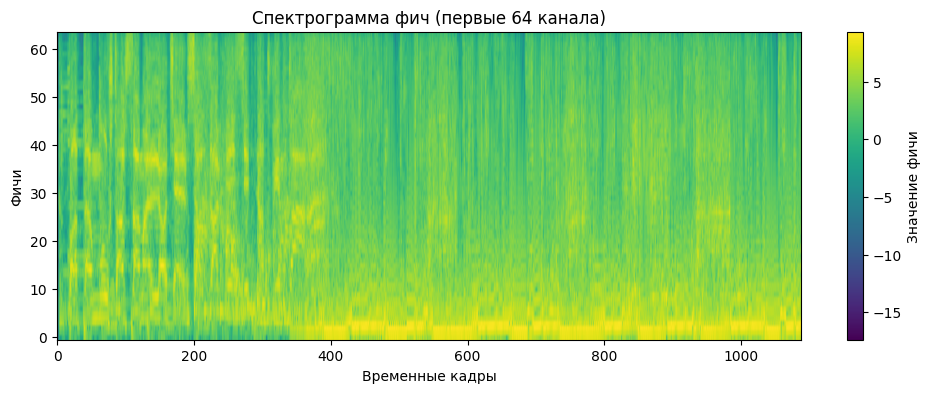

Фича 1: min=-15.6221, max=8.8303, mean=5.1595
Фича 2: min=-13.9415, max=8.8388, mean=6.1744
Фича 3: min=-12.7790, max=9.3350, mean=6.8452
Фича 4: min=-13.3058, max=9.3129, mean=6.7774
Фича 5: min=-14.6028, max=9.1278, mean=6.1958
Фича 6: min=-13.7405, max=8.8938, mean=5.9560
Фича 7: min=-13.7770, max=8.7488, mean=5.7048
Фича 8: min=-15.1282, max=8.2776, mean=5.5032
Фича 9: min=-16.5204, max=8.4052, mean=5.2768
Фича 10: min=-14.9011, max=8.5010, mean=5.0368
Фича 11: min=-14.4390, max=8.3208, mean=4.7932
Фича 12: min=-15.2669, max=8.1808, mean=4.7526
Фича 13: min=-16.2735, max=8.3765, mean=4.4956
Фича 14: min=-16.1677, max=8.0331, mean=4.3321
Фича 15: min=-17.3961, max=8.5893, mean=4.3472
Фича 16: min=-15.4328, max=9.1602, mean=4.4426
Фича 17: min=-16.2330, max=8.6491, mean=4.0759
Фича 18: min=-15.4767, max=7.7078, mean=3.9155
Фича 19: min=-15.9598, max=8.2198, mean=4.0276
Фича 20: min=-14.9919, max=7.9711, mean=3.6064
Фича 21: min=-13.6543, max=7.6380, mean=3.7263
Фича 22: min=-12.7712,

In [109]:
# Получение модели из виртуальной среды
# Default cache directory
cache_dir = os.path.expanduser("~/.cache/gigaam")
model_path = os.path.join(cache_dir, "v2_ctc.ckpt")

# Если файд не обнаружен - скачаем его
if os.path.exists(model_path):
    file_size = os.path.getsize(model_path)
    print(f"Файл найден: {model_path}, размер: {file_size} байт")
    if file_size == 0:
        print("Файл пустой, удаляем и попробуем скачать заново")
        os.remove(model_path)
else:
    print(f"Файл не найден: {model_path}, будет выполнен новый запрос")

# Загрузка модели v2_ctc из GigaAM
model = load_model("v2_ctc", fp16_encoder=False, device="cpu")

# Экспорт в ONNX
# В путь виртуального окружения
model.to_onnx(dir_path="./onnx_models")
# В путь гугл Диска
model.to_onnx(dir_path="/content/drive/MyDrive/onnx_models")

# Загрузка ONNX-сессии
session = rt.InferenceSession("./onnx_models/v2_ctc.onnx", providers=["CPUExecutionProvider"])

# !pip uninstall numpy -y
# !pip install "numpy<2"
import numpy as np
print(f"NumPy version: {np.__version__}")


# Проверка входов и выходов модели
print("Inputs expected by the model:")
for input_tensor in session.get_inputs():
    print(f"Input name: {input_tensor.name}, Shape: {input_tensor.shape}")

print("Outputs of the model:")
for output_tensor in session.get_outputs():
    print(f"Output name: {output_tensor.name}, Shape: {output_tensor.shape}")

# Подготовка входных данных
audio = load_audio(source_path)
print("Audio shape:", audio.shape)
preprocessor = FeatureExtractor(sample_rate=16000, features=64)
features, lengths = preprocessor(audio.unsqueeze(0), torch.tensor([audio.shape[-1]]))
features = features.detach().cpu().numpy().astype(np.float32)
lengths = lengths.detach().cpu().numpy().astype(np.int64)

print("Shape:", features.shape)  # размерность (например, [1, 64, T] для batch=1)
print("Data type:", features.dtype)  # тип данных (np.float32)
print("Min value:", np.min(features))  # минимальное значение
print("Max value:", np.max(features))  # максимальное значение
print("Mean value:", np.mean(features))  # среднее значение
print("Std deviation:", np.std(features))  # стандартное отклонение

import matplotlib.pyplot as plt

# Для примера: отображение первой фичи в батче (если features.shape = [1, 64, T])
plt.figure(figsize=(12, 4))
plt.imshow(features[0], aspect='auto', origin='lower', cmap='viridis')
plt.colorbar(label='Значение фичи')
plt.xlabel('Временные кадры')
plt.ylabel('Фичи')
plt.title('Спектрограмма фич (первые 64 канала)')
plt.show()

for i in range(features.shape[1]):  # для каждого из 64 признаков
    channel = features[0, i, :]
    print(f"Фича {i+1}: min={np.min(channel):.4f}, max={np.max(channel):.4f}, mean={np.mean(channel):.4f}")

# Инференс
inputs = {"features": features, "feature_lengths": lengths}
log_probs = session.run(["log_probs"], inputs)[0]

# Декодирование (жадное)
token_ids = []
prev_tok = MY_CONSTANTS.BLANK_IDX
max_vocab_idx = len(VOCAB) - 1
print("Log probs shape:", log_probs.shape)
print("Predicted token indices:", log_probs.argmax(-1).squeeze().tolist())

for tok in log_probs.argmax(-1).squeeze().tolist():
    if tok > max_vocab_idx:
        print(f"Warning: Token {tok} exceeds VOCAB size ({max_vocab_idx}), skipping")
        continue
    if (tok != prev_tok or prev_tok == MY_CONSTANTS.BLANK_IDX) and tok != MY_CONSTANTS.BLANK_IDX:
        token_ids.append(tok)
    prev_tok = tok

transcription = "".join(VOCAB[tok] for tok in token_ids)
print("Транскрипция:", transcription)

## 🔦Пишем свою версию инференса на PyTorch

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Inputs expected by the model:
Input name: features, Shape: ['batch_size', 64, 'seq_len']
Input name: feature_lengths, Shape: ['batch_size']
Outputs of the model:
Output name: log_probs, Shape: ['batch_size', 'seq_len', 34]
Аудио СТЕРЕО -> МОНО (левый канал)
Audio shape: torch.Size([1, 173952])
Аудио стерео, все ок
AUDIO
MSE between PyTorch and Librosa MFCC: 0.0003878289135172963
MSE between PyTorch and Librosa LFCC: 22.659224978072267
Pitch: tensor([[ 842.1053,  842.1053,  842.1053,  ..., 2666.6667, 2666.6667,
         2666.6667]])
Audio shape 2: torch.Size([2, 173952])
Диапазон значений итогового аудио tensor(-3.9201e-05) tensor(3.8508e-05)
Максимальное расхождение для первого примера (моно): 1.2189867496490479
Максимальное расхождение для второго примера (стерео): 0.9999721050262451
MSE between torchaudio and librosa: 6.802622929024324e-18
Тип <class 'torch

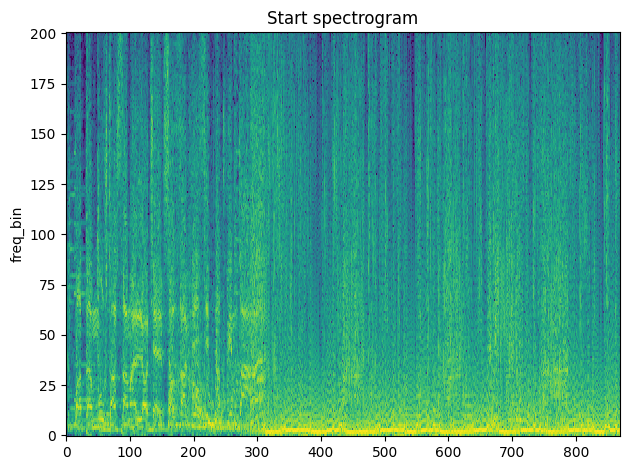

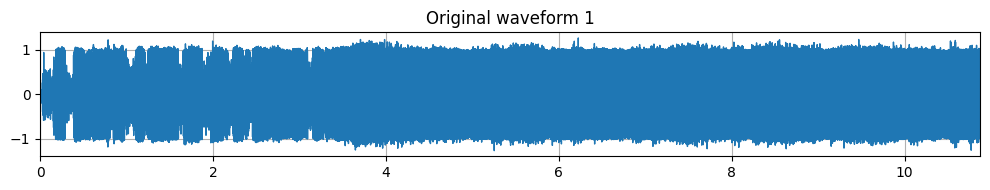

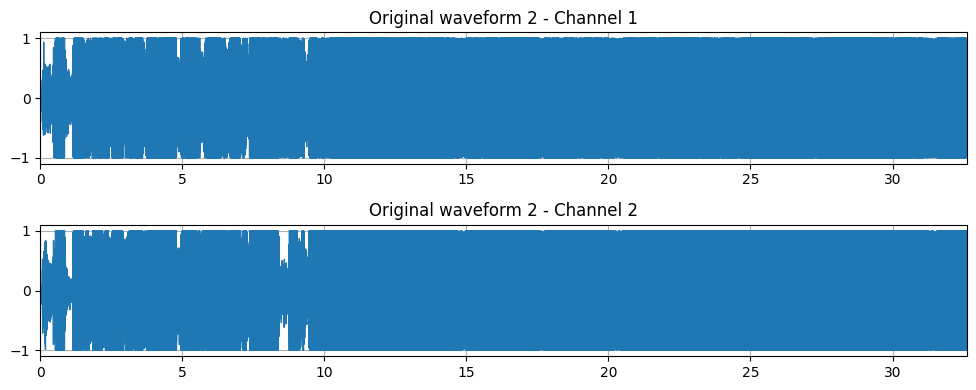

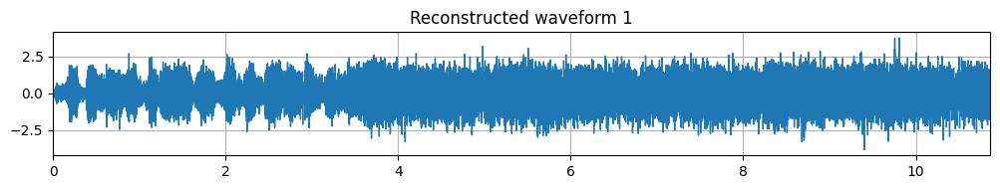

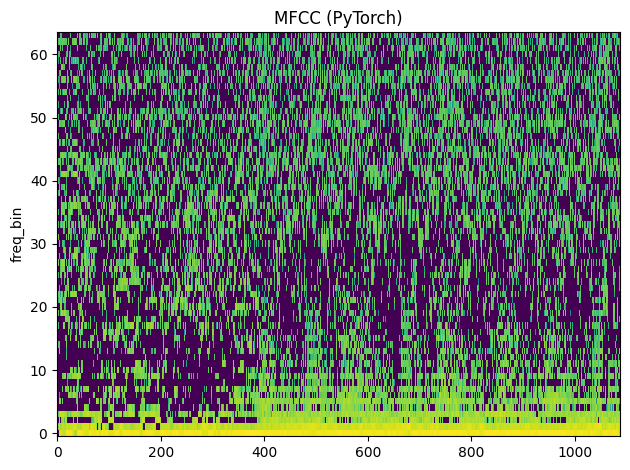

...

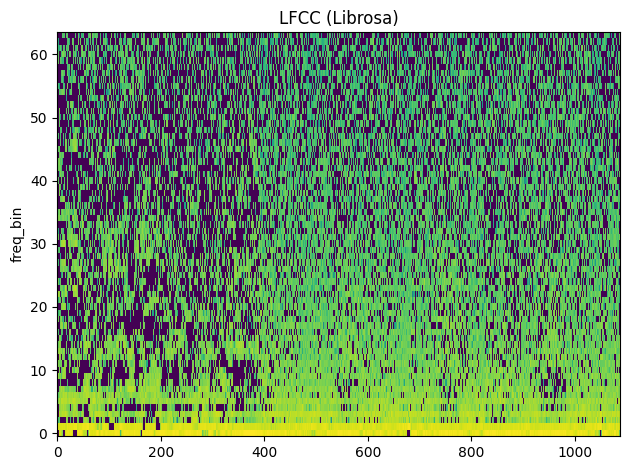

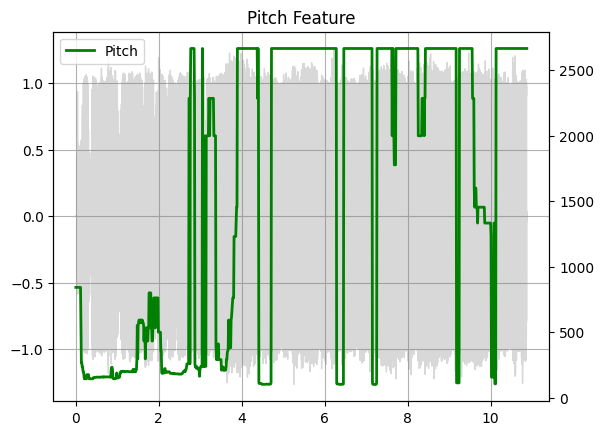

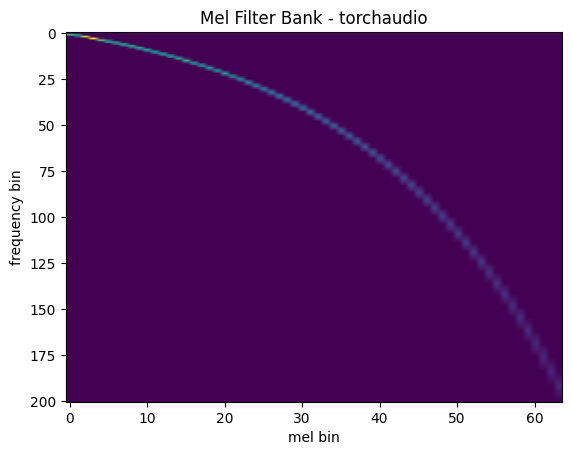

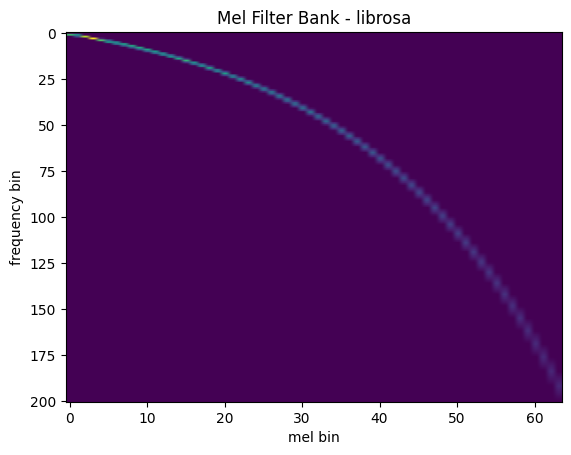

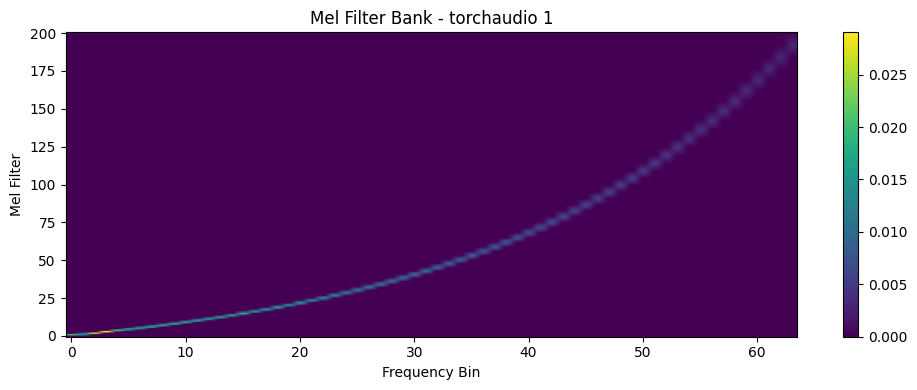

Результаты для моно канала
Shape: (1, 1, 64, 1088)
Data type: float32
Min value: -20.723267
Max value: 5.9213777
Mean value: -0.88819957
Std deviation: 2.6164722
Фича 1: min=-20.7233, max=5.9214, mean=-0.8882
Результаты для стерео канала
Shape: (1, 2, 64, 1088)
Data type: float32
Min value: -20.723267
Max value: -14.873037
Mean value: -20.098322
Std deviation: 1.2115597
Фича 1: min=-20.7233, max=-14.8730, mean=-20.0944
Фича 2: min=-20.7233, max=-14.8765, mean=-20.1022


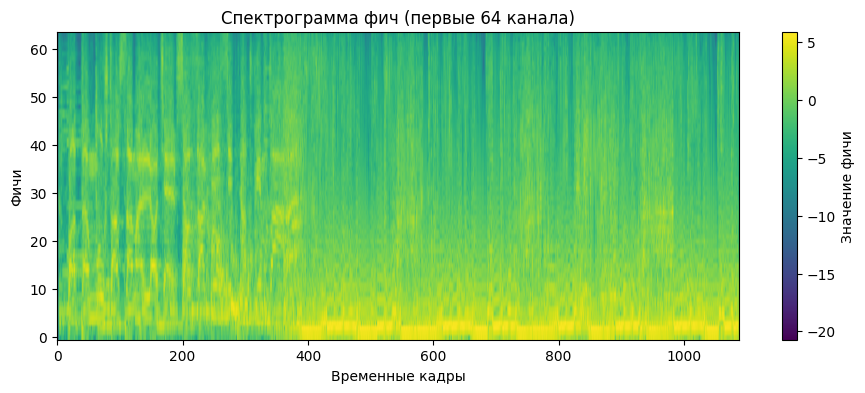

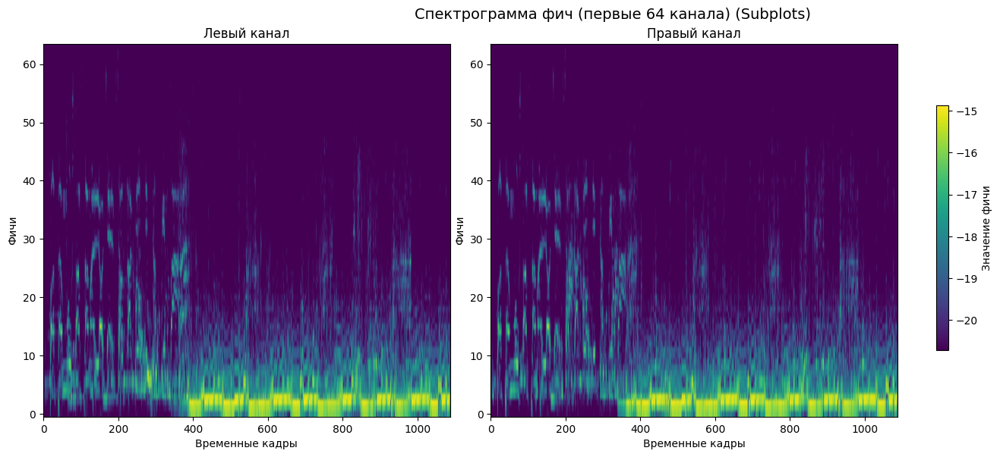

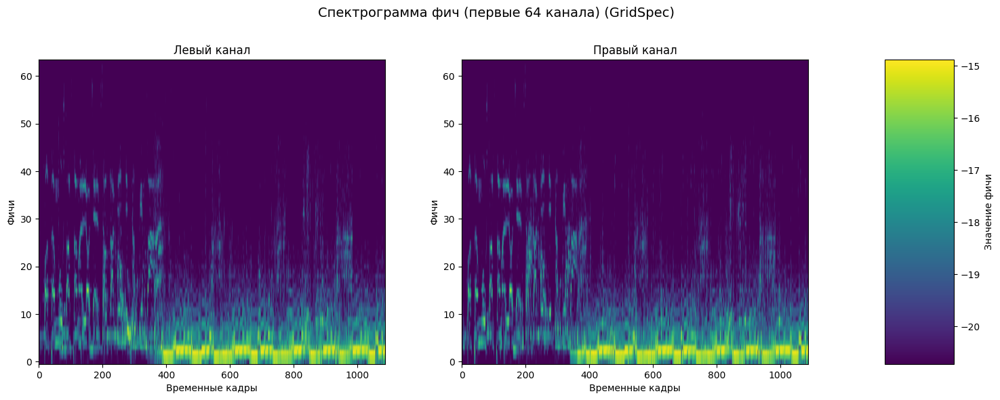

Log probs shape: (1, 272, 34)
Predicted token indices: [33, 33, 33, 33, 33, 33, 16, 15, 15, 33, 33, 19, 15, 33, 13, 20, 33, 0, 0, 24, 19, 15, 0, 0, 0, 0, 3, 0, 0, 33, 18, 1, 33, 13, 15, 33, 33, 12, 6, 33, 33, 19, 19, 6, 33, 33, 0, 0, 0, 3, 18, 6, 6, 33, 0, 0, 0, 33, 8, 1, 33, 33, 3, 9, 33, 33, 18, 9, 33, 19, 19, 33, 0, 0, 0, 15, 19, 19, 0, 33, 3, 9, 33, 14, 33, 33, 19, 1, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 3

In [91]:
import torchaudio
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import librosa
from google.colab import drive
from IPython.display import Audio
from matplotlib.patches import Rectangle
from matplotlib.axes import Axes
from torchaudio.utils import download_asset
drive.mount('/content/drive')

class FeatureExtractor1(nn.Module):
    """
    Module for extracting Log-mel spectrogram features from raw audio signals.
    This module uses Torchaudio's MelSpectrogram transform to extract features
    and applies logarithmic scaling.
    """
    def __init__(self,
                 sample_rate: int = MY_CONSTANTS.SAMPLE_RATE,
                 features: int = MY_CONSTANTS.FEAT_IN):
        super().__init__()
        self.sample_rate = sample_rate
        self.features = features
        self.hop_length = sample_rate // 100
        self.n_fft = sample_rate // 40
        self.win_length = sample_rate // 40

        self.register_buffer(
                "mel_fb",
                torchaudio.functional.melscale_fbanks(
                n_freqs=int(self.n_fft // 2 + 1),
                f_min=0.0,
                f_max=self.sample_rate / 2.0,
                n_mels=self.features,
                sample_rate=self.sample_rate,
                norm="slaney"
        ))

        # Строим Mel Filter Blank с помощью библиотеки PyTorch
        mel_filters = torchaudio.functional.melscale_fbanks(
                  n_freqs=int(self.n_fft // 2 + 1),
                  f_min=0.0,
                  f_max=self.sample_rate / 2.0,
                  n_mels=self.features,
                  sample_rate=self.sample_rate,
                  norm="slaney"
                )
        plot_fbank(mel_filters, "Mel Filter Bank - torchaudio")

        # Строим Mel Filter Blank с помощью библиотеки Librossa
        mel_filters_librosa = librosa.filters.mel(
            sr=self.sample_rate,
            n_fft=self.n_fft,
            n_mels=self.features,
            fmin=0.0,
            fmax=self.sample_rate / 2.0,
            norm="slaney",
            htk=True,
        ).T
        plot_fbank(mel_filters_librosa, "Mel Filter Bank - librosa")

        # Находим MSE метрику между результатами на PyTorch и Librossa
        mse = torch.square(mel_filters - mel_filters_librosa).mean().item()
        print(f"MSE between torchaudio and librosa: {mse}")

        self.spec_scaler = SpecScaler()

    # Функция построения графика Mel Filter Blank
    def plot_fbank(self,
                   mel_filters: Tensor,
                   title: str):
        """Plot the filter bank.

        Args:
            mel_filters (Tensor): The filter bank to plot.
            title (str): The title of the plot.
        """
        plt.figure(figsize=(10, 4))
        plt.imshow(mel_filters, aspect="auto", origin="lower")
        plt.title(title)
        plt.xlabel("Frequency Bin")
        plt.ylabel("Mel Filter")
        plt.colorbar()
        plt.tight_layout()
        plt.show()


    def out_len(self,
                input_lengths: Tensor) -> Tensor:
        """
        Calculates the output length after the feature extraction process.
        """
        return input_lengths.div(self.hop_length, rounding_mode="floor").add(1).long()

    def forward(self,
                input_signal: Tensor,
                length: Tensor) -> Tuple[Tensor, Tensor]:
        """
        Extract Log-mel spectrogram features from the input audio signal.
        """

        spectrogram = torchaudio.functional.spectrogram(
            waveform=input_signal,
            pad=0,
            n_fft=self.n_fft,
            win_length=self.win_length,
            hop_length=self.hop_length,
            window=torch.hann_window(self.win_length, device=input_signal.device),
            power=2.0,
            normalized=False,
            # onesided=True,
            # center=True,
            # pad_mode="reflect",
            # return_complex=False,
        )

        # mel_spec = torch.matmul(spectrogram.pow(2.0).transpose(-1, -2), self.mel_fb.to(spectrogram.device))
        mel_spec = torch.matmul(spectrogram.transpose(-2, -1), self.mel_fb).transpose(-2, -1)

        return self.spec_scaler(mel_spec), self.out_len(length)

# Первый вариант замены функции для аудио
def load_audio_new1(
    audio_path: str,
    sample_rate: int = MY_CONSTANTS.SAMPLE_RATE,
    return_format: str = "float",
    load_type: str = "mono"
) -> torch.Tensor:
    # Загружаем аудио как 16-bit PCM без нормализации
    waveform, original_sample_rate = torchaudio.load(
        audio_path,
        normalize=False
    )

    # Конвертируем в float32 для обработки
    waveform = waveform.float()

    # Конвертируем в моно (если стерео)
    # НАХОДИТЬ СРЕДНЕЕ НЕХОРОШО: ИЛИ ЮЗАЕМ 1й, или юзаем оба
    # if waveform.dim() == 2:
    #     waveform = waveform.mean(dim=0)

    if load_type == "mono":
        if waveform.dim() == 2:
            print("Аудио СТЕРЕО -> МОНО (левый канал)")
            waveform = waveform[0:1]  # Берём левый канал
        elif waveform.dim() == 1:
            print("Аудио уже МОНО")
            waveform = waveform.unsqueeze(0)
        else:
            raise ValueError("Неподдерживаемое количество каналов в аудио - ошибка МОНО")
    elif load_type == "stereo":
        if waveform.dim() == 1:
            print("Аудио МОНО -> СТЕРЕО (дублирование канала)")
            waveform = torch.stack([waveform, waveform])
        elif waveform.dim() == 2 and waveform.size(0) == 1:
            print("Псевдо-МОНО -> СТЕРЕО (дублирование канала)")
            waveform = torch.cat([waveform, waveform], dim=0)
        elif waveform.dim() == 2 and waveform.size(0) == 2:
            print("Аудио уже СТЕРЕО")
        else:
            raise ValueError("Неподдерживаемое количество каналов в аудио - ошибка СТЕРЕО")

    # Ресемплируем при необходимости
    if original_sample_rate != sample_rate:
        waveform = torchaudio.functional.resample(
            waveform,
            orig_freq=original_sample_rate,
            new_freq=sample_rate
        )

    # Точная нормализация как в оригинале
    if return_format == "float":
        waveform = waveform / 32768.0
    else:
        waveform = waveform.short()  # конвертируем обратно в int16

    return waveform

"""
Функция по выдаче статистики по каждому из каналов.
"""
def print_statistic_data(features: Tensor) -> None:
    print("Shape:", features.shape)  # Размерность (например, [1, 64, T] для batch=1)
    print("Data type:", features.dtype)  # Тип данных (np.float32)
    print("Min value:", np.min(features))  # Минимальное значение
    print("Max value:", np.max(features))  # Максимальное значение
    print("Mean value:", np.mean(features))  # Среднее значение
    print("Std deviation:", np.std(features))  # Стандартное отклонение

    for i in range(features.shape[1]):  # для каждого из 64 признаков
      channel = features[0, i, :]
      print(f"Фича {i+1}: min={np.min(channel):.4f}, max={np.max(channel):.4f}, mean={np.mean(channel):.4f}")

"""
Функция для построения графика моноканала.
"""
def mono_graph(features: Tensor) -> None:
    plt.figure(figsize=(11, 4))
    if features.ndim == 4:  # (batch_size, channels, n_mels, time_frames)
        features = features[0, 0]  # Первый батч, первый канал
    elif features.ndim == 3:  # (channels, n_mels, time_frames)
        features = features[0]  # Первый канал
    plt.imshow(features, aspect='auto', origin='lower', cmap='viridis')
    plt.colorbar(label='Значение фичи')
    plt.xlabel('Временные кадры')
    plt.ylabel('Фичи')
    plt.title('Спектрограмма фич (первые 64 канала)')
    plt.show()

"""
Функция для построения графика стереоканала (через subploats).
"""
def stereo_subploats_graph(features: Tensor) -> None:
    # Для примера: отображение первой фичи в батче (если features.shape = [1, 64, T])
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))  # 1 row, 2 columns
    # Левый канал
    im1 = axes[0].imshow(features[0][0], aspect='auto', origin='lower', cmap='viridis')
    axes[0].set_title('Левый канал')
    axes[0].set_xlabel('Временные кадры')
    axes[0].set_ylabel('Фичи')
    # Правый канал
    im2 = axes[1].imshow(features[0][1], aspect='auto', origin='lower', cmap='viridis')
    axes[1].set_title('Правый канал')
    axes[1].set_xlabel('Временные кадры')
    axes[1].set_ylabel('Фичи')
    fig.colorbar(im1, ax=axes, shrink=0.7, location='right', label='Значение фичи')
    fig.suptitle('Спектрограмма фич (первые 64 канала) (Subplots)', fontsize=14, y=0.98)
    plt.subplots_adjust(top=0.90, bottom=0.08, left=0, right=0.75, wspace=0.1)
    plt.show()

"""
Функция для построения графика стереоканала (через GridSpec).
"""
def stereo_gridspec_graph(features: Tensor) -> None:
    fig = plt.figure(figsize=(15, 6))
    gs = GridSpec(1, 3, width_ratios=[1, 1, 0.2])  # 1 строка, 3 столбца, колорбар уже
    # Левый канал
    ax0 = plt.subplot(gs[0])
    im1 = ax0.imshow(features[0][0], aspect='auto', origin='lower', cmap='viridis')
    ax0.set_title('Левый канал')
    ax0.set_xlabel('Временные кадры')
    ax0.set_ylabel('Фичи')
    # Правый канал
    ax1 = plt.subplot(gs[1])
    im2 = ax1.imshow(features[0][1], aspect='auto', origin='lower', cmap='viridis')
    ax1.set_title('Правый канал')
    ax1.set_xlabel('Временные кадры')
    ax1.set_ylabel('Фичи')
    # Колорбар
    ax_cb = plt.subplot(gs[2])
    fig.colorbar(im1, cax=ax_cb, label='Значение фичи') #Передаём ось для колорбара
    # Общий заголовок
    fig.suptitle('Спектрограмма фич (первые 64 канала) (GridSpec)', fontsize=14, y=0.98)
    # Настройка расположения - убираем plt.tight_layout и plt.subplots_adjust
    gs.update(top=0.85, bottom=0.1, left=0.05, right=0.95, wspace=0.3)
    plt.show()

# Функция для построения WaveForm
def plot_waveform(waveform: torch.Tensor,
                  sr: int,
                  title: Optional[str] = "Waveform",
                  ax: Optional[Axes] = None)-> None:
    if torch.is_tensor(waveform):
        waveform = waveform.numpy()
    # Если это уже NumPy-массив, оставляем как есть
    elif not isinstance(waveform, np.ndarray):
        raise ValueError("Waveform должен быть PyTorch-тензором или NumPy-массивом")

    # Обрабатываем размерности
    if waveform.ndim == 1:
        waveform = waveform[np.newaxis, :]  # Добавляем канал: (T,) -> (1, T)

    num_channels, num_frames = waveform.shape
    time_axis = np.arange(0, num_frames) / sr  # Используем NumPy вместо torch.arange

    if ax is None:
        _, ax = plt.subplots(num_channels, 1, figsize=(10, 2 * num_channels))

    if num_channels == 1:
        ax.plot(time_axis, waveform[0], linewidth=1)
        ax.grid(True)
        ax.set_xlim([0, time_axis[-1]])
        ax.set_title(title)
    else:
        for ch in range(num_channels):
            ax[ch].plot(time_axis, waveform[ch], linewidth=1)
            ax[ch].grid(True)
            ax[ch].set_xlim([0, time_axis[-1]])
            ax[ch].set_title(f"{title} - Channel {ch + 1}")

    plt.tight_layout()

# Функция для построения спектрограммы
def plot_spectrogram(specgram: torch.Tensor | np.ndarray,
                     title: Optional[str] = None,
                     ylabel: str = "freq_bin",
                     ax: Optional[Axes] = None) -> None:
    if ax is None:
        _, ax = plt.subplots(1, 1)
    if title is not None:
        ax.set_title(title)
    ax.set_ylabel(ylabel)
    if torch.is_tensor(specgram):
        specgram = specgram.numpy()
    ax.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto", interpolation="nearest")
    plt.tight_layout()

# Функция для построения Pitch
def plot_pitch(waveform: torch.Tensor,
               sr: float,
               pitch: torch.Tensor) -> None:
    figure, axis = plt.subplots(1, 1)
    axis.set_title("Pitch Feature")
    axis.grid(True)

    if sr != 0: end_time = waveform.shape[1] / sr
    time_axis = torch.linspace(0, end_time, waveform.shape[1])
    axis.plot(time_axis, waveform[0], linewidth=1, color="gray", alpha=0.3)

    axis2 = axis.twinx()
    time_axis = torch.linspace(0, end_time, pitch.shape[1])
    axis2.plot(time_axis, pitch[0], linewidth=2, label="Pitch", color="green")

    axis2.legend(loc=0)

# Функция для нахождения линейных фильтров (LFCC)
def create_linear_filters(n_filters: int,
                          n_fft: int,
                          fmin: float,
                          fmax: float,
                          freqs: np.ndarray) -> np.ndarray:
    filters = np.zeros(n_filters, len(freqs))
    filter_points = np.linspace(fmin, fmax, n_filters + 2)  # Границы фильтров

    for i in range(n_filters):
        left = filter_points[i]
        center = filter_points[i + 1]
        right = filter_points[i + 2]

        # Левый склон
        left_mask = (freqs >= left) & (freqs <= center)
        filters[i, left_mask] = (freqs[left_mask] - left) / (center - left)

        # Правый склон
        right_mask = (freqs > center) & (freqs <= right)
        filters[i, right_mask] = (right - freqs[right_mask]) / (right - center)

    return filters

# Основная функция вычисления LFCC метрики для библиотеки Librosa
def compute_lfcc(y: np.ndarray | None,
                 sr: float,
                 n_fft: int,
                 win_length: int | None,
                 hop_length: int,
                 n_filters: int,
                 n_lfcc: int,
                 fmin: float=0.0,
                 fmax: float=None) -> float:
    # Вычисляем спектрограмму (мощность)
    S = librosa.stft(
        y=y,
        n_fft=n_fft,
        win_length=win_length,
        hop_length=hop_length,
        window='hann'
    )
    power_spec = np.abs(S) ** 2  # Спектрограмма мощности

    # Частоты для STFT
    freqs = np.linspace(fmin, fmax or sr / 2, n_fft // 2 + 1)

    # Создаём линейные фильтры
    filters = create_linear_filters(n_filters, n_fft, fmin, fmax or sr / 2, freqs)

    # Применяем линейные фильтры к спектрограмме
    lfcc_spec = np.dot(filters, power_spec)

    # Преобразуем в децибелы
    lfcc_spec_db = librosa.power_to_db(lfcc_spec)

    # Применяем DCT для получения LFCC
    lfcc = librosa.feature.mfcc(
        S=lfcc_spec_db,
        n_mfcc=n_lfcc,
        dct_type=2,
        norm="ortho"
    )
    return lfcc


# Загрузка ONNX-сессии
session = rt.InferenceSession("./drive/MyDrive/onnx_models/v2_ctc.onnx", providers=["CPUExecutionProvider"])

# Проверка входов и выходов модели
print("Inputs expected by the model:")
for input_tensor in session.get_inputs():
    print(f"Input name: {input_tensor.name}, Shape: {input_tensor.shape}")

print("Outputs of the model:")
for output_tensor in session.get_outputs():
    print(f"Output name: {output_tensor.name}, Shape: {output_tensor.shape}")

# Подготовка входных данных
audio3 = load_audio_new1(source_path, load_type="mono")
print("Audio shape:", audio3.shape)

# Второй вариант замены функции для аудио
audio4, original_sample_rate = torchaudio.load(source_path)

# Продолжаем работать в стерео формате:
if audio4.dim() == 1:  # Если моно
    print("Аудио моно, сконвертируем в стерео, продублировав канал")
    audio4 = torch.stack([audio4, audio4])  # Дублируем канал для создания стерео
elif audio4.dim() == 2:  # Если стерео
    print("Аудио стерео, все ок")
    pass # Ничего не делаем, аудио и так стерео
else:
    raise ValueError("Неподдерживаемое количество каналов в аудио")

n_fft_test = MY_CONSTANTS.SAMPLE_RATE // 40
n_mels_test = 64
n_mfcc_test = 64
n_lfcc_test = 64
hop_length_test = MY_CONSTANTS.SAMPLE_RATE // 100
win_length_test = MY_CONSTANTS.SAMPLE_RATE // 40
spectrogram = torchaudio.transforms.Spectrogram(n_fft=n_fft_test)
griffin_lim = torchaudio.transforms.GriffinLim(n_fft=n_fft_test)
spec = spectrogram(audio3)
reconstructed_waveform = griffin_lim(spec)
plot_spectrogram(spec[0], title="Start spectrogram")
plot_waveform(audio3, MY_CONSTANTS.SAMPLE_RATE, title="Original waveform 1")
plot_waveform(audio4, MY_CONSTANTS.SAMPLE_RATE, title="Original waveform 2")
plot_waveform(reconstructed_waveform, MY_CONSTANTS.SAMPLE_RATE, title="Reconstructed waveform 1")
print("AUDIO")
Audio(audio3.numpy(), rate=MY_CONSTANTS.SAMPLE_RATE)
Audio(audio4.numpy(), rate=MY_CONSTANTS.SAMPLE_RATE)
Audio(source_path, rate=MY_CONSTANTS.SAMPLE_RATE)

mfcc_transform = torchaudio.transforms.MFCC(
    sample_rate=MY_CONSTANTS.SAMPLE_RATE,
    n_mfcc=n_mfcc_test,
    melkwargs={
        "n_fft": n_fft_test,
        "n_mels": n_mels_test,
        "hop_length": hop_length_test,
        "mel_scale": "htk",
    },
)
mfcc = mfcc_transform(audio3)
plot_spectrogram(mfcc[0], title="MFCC (PyTorch)")

lfcc_transform = torchaudio.transforms.LFCC(
    sample_rate=MY_CONSTANTS.SAMPLE_RATE,
    n_lfcc=n_lfcc_test,
    speckwargs={
        "n_fft": n_fft_test,
        "hop_length": hop_length_test,
        "win_length": win_length_test,
    },
)
lfcc = lfcc_transform(audio3)
plot_spectrogram(lfcc[0], title="LFCC (PyTorch)")

melspec = librosa.feature.melspectrogram(
    y=audio3.numpy().squeeze(),
    sr=MY_CONSTANTS.SAMPLE_RATE,
    n_fft=n_fft_test,
    win_length=win_length_test,
    hop_length=hop_length_test,
    n_mels=n_mels_test,
    htk=True,
    fmin=0.0,
    fmax=MY_CONSTANTS.SAMPLE_RATE / 2.0,
    norm=None
)

mfcc_librosa = librosa.feature.mfcc(
    S=librosa.core.spectrum.power_to_db(melspec),
    n_mfcc=n_mfcc_test,
    dct_type=2,
    norm="ortho",
)
plot_spectrogram(mfcc_librosa, title="MFCC (Librosa)")

mse_mfcc = torch.square(torch.from_numpy(mfcc_librosa) - mfcc).mean().item()
print(f"MSE between PyTorch and Librosa MFCC: {mse_mfcc}")

# Вычисляем LFCC
lfcc_librosa = compute_lfcc(
    y=audio3.numpy().squeeze(),
    sr=MY_CONSTANTS.SAMPLE_RATE,
    n_fft=n_fft_test,
    win_length=win_length_test,
    hop_length=hop_length_test,
    n_filters=n_lfcc_test,
    n_lfcc=n_lfcc_test,
    fmin=0.0,
    fmax=MY_CONSTANTS.SAMPLE_RATE / 2.0
)

# Отображаем LFCC
plot_spectrogram(lfcc_librosa, title="LFCC (Librosa)")

mse_lfcc = torch.square(torch.from_numpy(lfcc_librosa) - lfcc).mean().item()
print(f"MSE between PyTorch and Librosa LFCC: {mse_lfcc}")

pitch = torchaudio.functional.detect_pitch_frequency(audio3, MY_CONSTANTS.SAMPLE_RATE)
print("Pitch:", pitch)
plot_pitch(audio3, MY_CONSTANTS.SAMPLE_RATE, pitch)

if original_sample_rate != MY_CONSTANTS.SAMPLE_RATE:
        audio4 = torchaudio.functional.resample(
            audio4,
            original_sample_rate,
            MY_CONSTANTS.SAMPLE_RATE
)
audio4 = audio4 / 32768.0
print("Audio shape 2:", audio4.shape)
print("Диапазон значений итогового аудио", audio4.min(), audio4.max())

# Сравнение
print("Максимальное расхождение для первого примера (моно):", torch.max(torch.abs(audio - audio3)).item())
print("Максимальное расхождение для второго примера (стерео):", torch.max(torch.abs(audio - audio4)).item())

# Получаем результаты для моно и стерео канала
preprocessor = FeatureExtractor1(sample_rate=16000, features=64)
mel_filters1 = preprocessor.mel_fb
print("Тип", type(mel_filters1))
preprocessor.plot_fbank(mel_filters1, "Mel Filter Bank - torchaudio 1")
features, lengths = preprocessor(audio3.unsqueeze(0), torch.tensor([audio3.shape[-1]]))
features = features.detach().cpu().numpy().astype(np.float32)
lengths = lengths.detach().cpu().numpy().astype(np.int64)

features1, lengths1 = preprocessor(audio4.unsqueeze(0), torch.tensor([audio4.shape[-1]]))
features1 = features1.detach().cpu().numpy().astype(np.float32)
lengths1 = lengths1.detach().cpu().numpy().astype(np.int64)

# Предоставляем статистические результаты по каждому из каналов
print("Результаты для моно канала")
print_statistic_data(features)

print("Результаты для стерео канала")
print_statistic_data(features1)

# Отображение первой фичи в батче (если features.shape = [1, 64, T])
# График для моно-канала
mono_graph(features)

# Первый график для стерео-канала (с использованием subploats)
stereo_subploats_graph(features1)

# Второй график для стерео-канала (с использованием GridSpec)
stereo_gridspec_graph(features1)

# Инференс
features_for_onnx = features.squeeze(1)  # (1, 1, 64, T) -> (1, 64, T)
inputs = {"features": features_for_onnx, "feature_lengths": lengths}
log_probs = session.run(["log_probs"], inputs)[0]

# Декодирование (жадное)
token_ids = []
prev_tok = MY_CONSTANTS.BLANK_IDX
max_vocab_idx = len(VOCAB) - 1
print("Log probs shape:", log_probs.shape)
print("Predicted token indices:", log_probs.argmax(-1).squeeze().tolist())

for tok in log_probs.argmax(-1).squeeze().tolist():
    if tok > max_vocab_idx:
        print(f"Warning: Token {tok} exceeds VOCAB size ({max_vocab_idx}), skipping")
        continue
    if (tok != prev_tok or prev_tok == MY_CONSTANTS.BLANK_IDX) and tok != MY_CONSTANTS.BLANK_IDX:
        token_ids.append(tok)
    prev_tok = tok

transcription = "".join(VOCAB[tok] for tok in token_ids)
print("Транскрипция:", transcription)

## ♒︎ Игры с мелспектрограммами

In [16]:
!pip install librosa
import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

print(torch.__version__)
print(torchaudio.__version__)

import librosa
import matplotlib.pyplot as plt

from IPython.display import Audio
from matplotlib.patches import Rectangle
from torchaudio.utils import download_asset

2.2.1+cpu
2.2.1+cpu


In [17]:
torch.random.manual_seed(0)

SAMPLE_SPEECH = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")


def plot_waveform(waveform, sr, title="Waveform", ax=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sr

    if ax is None:
        _, ax = plt.subplots(num_channels, 1)
    ax.plot(time_axis, waveform[0], linewidth=1)
    ax.grid(True)
    ax.set_xlim([0, time_axis[-1]])
    ax.set_title(title)


def plot_spectrogram(specgram, title=None, ylabel="freq_bin", ax=None):
    if ax is None:
        _, ax = plt.subplots(1, 1)
    if title is not None:
        ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto", interpolation="nearest")


def plot_fbank(fbank, title=None):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Filter bank")
    axs.imshow(fbank, aspect="auto")
    axs.set_ylabel("frequency bin")
    axs.set_xlabel("mel bin")

100%|██████████| 106k/106k [00:00<00:00, 3.73MB/s]


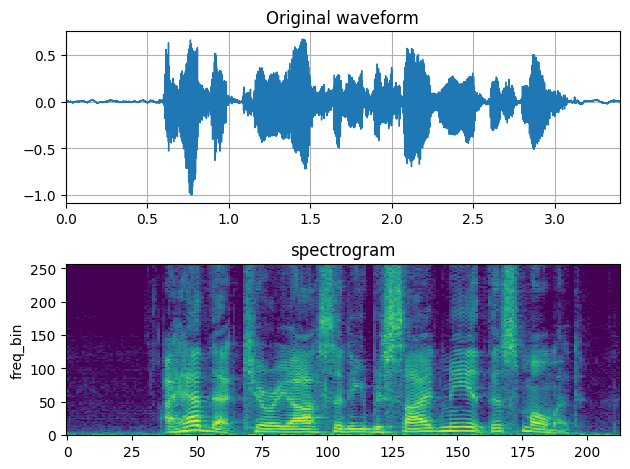

In [18]:
# Load audio
SPEECH_WAVEFORM, SAMPLE_RATE = torchaudio.load(SAMPLE_SPEECH)

# Define transform
spectrogram = T.Spectrogram(n_fft=512)

# Perform transform
spec = spectrogram(SPEECH_WAVEFORM)

fig, axs = plt.subplots(2, 1)
plot_waveform(SPEECH_WAVEFORM, SAMPLE_RATE, title="Original waveform", ax=axs[0])
plot_spectrogram(spec[0], title="spectrogram", ax=axs[1])
fig.tight_layout()

In [19]:
Audio(SPEECH_WAVEFORM.numpy(), rate=SAMPLE_RATE)

In [76]:
# А проверим-ка нашу аудио запись...
Audio(source_path, rate=MY_CONSTANTS.SAMPLE_RATE)

![link](https://drive.google.com/drive/MyDrive/n_fft.png)

Изображение успешно загружено из /content/drive/MyDrive/n_fft.png


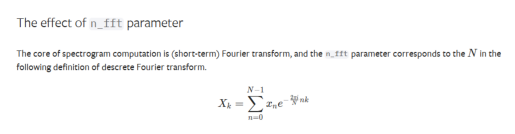

In [22]:
!pip install Pillow
from PIL import Image
import io

image_path = '/content/drive/MyDrive/n_fft.png'

try:
    img = Image.open(image_path)
    print(f"Изображение успешно загружено из {image_path}")
    # img.show()  # Это может не работать в Colab
    # import matplotlib.pyplot as plt
    plt.imshow(img)
    plt.axis('off')
    plt.show()

except FileNotFoundError:
    print(f"Ошибка: Файл {image_path} не найден на Google Диске.")
except Exception as e:
    print(f"Произошла ошибка при загрузке изображения: {e}")


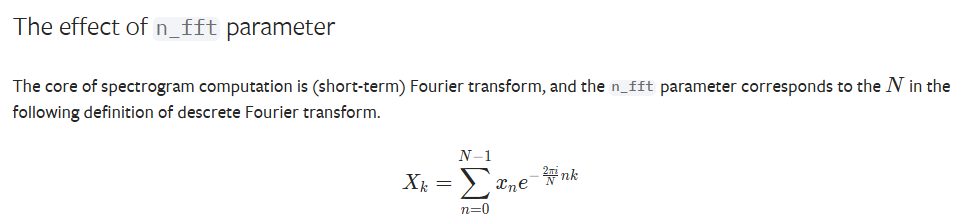

### 🎲The effect of n_fft parameter

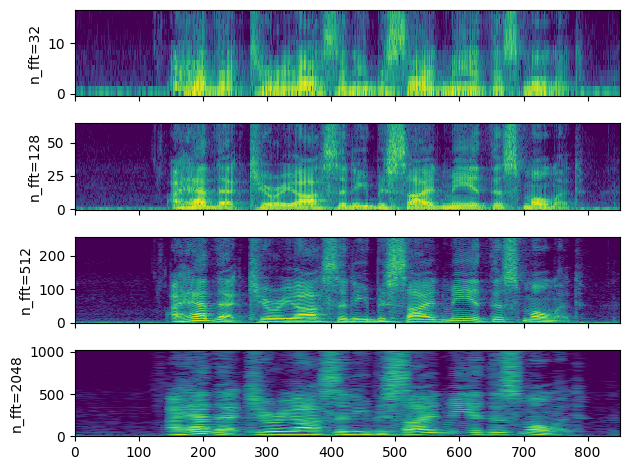

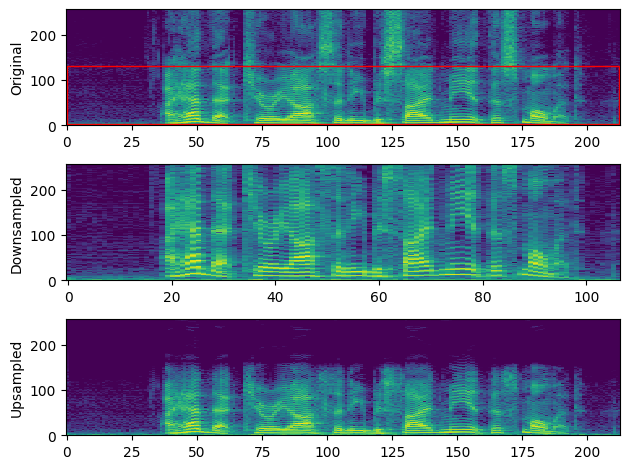

In [23]:
n_ffts = [32, 128, 512, 2048]
hop_length = 64

specs = []
for n_fft in n_ffts:
    spectrogram = T.Spectrogram(n_fft=n_fft, hop_length=hop_length)
    spec = spectrogram(SPEECH_WAVEFORM)
    specs.append(spec)

fig, axs = plt.subplots(len(specs), 1, sharex=True)
for i, (spec, n_fft) in enumerate(zip(specs, n_ffts)):
    plot_spectrogram(spec[0], ylabel=f"n_fft={n_fft}", ax=axs[i])
    axs[i].set_xlabel(None)
fig.tight_layout()

# Downsample to half of the original sample rate
speech2 = torchaudio.functional.resample(SPEECH_WAVEFORM, SAMPLE_RATE, SAMPLE_RATE // 2)
# Upsample to the original sample rate
speech3 = torchaudio.functional.resample(speech2, SAMPLE_RATE // 2, SAMPLE_RATE)

# Apply the same spectrogram
spectrogram = T.Spectrogram(n_fft=512)

spec0 = spectrogram(SPEECH_WAVEFORM)
spec2 = spectrogram(speech2)
spec3 = spectrogram(speech3)

# Visualize it
fig, axs = plt.subplots(3, 1)
plot_spectrogram(spec0[0], ylabel="Original", ax=axs[0])
axs[0].add_patch(Rectangle((0, 3), 212, 128, edgecolor="r", facecolor="none"))
plot_spectrogram(spec2[0], ylabel="Downsampled", ax=axs[1])
plot_spectrogram(spec3[0], ylabel="Upsampled", ax=axs[2])
fig.tight_layout()

### 🛠️GriffinLim

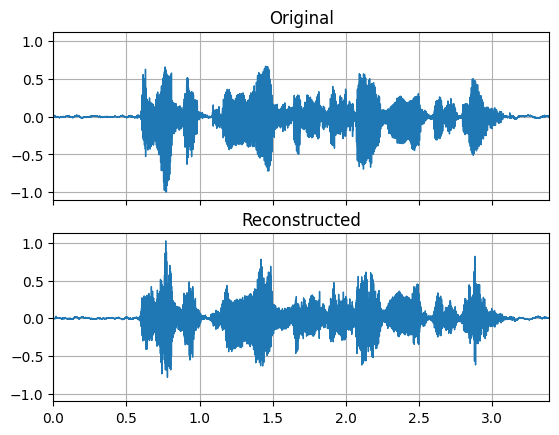

In [24]:
# Define transforms
n_fft = 1024
spectrogram = T.Spectrogram(n_fft=n_fft)
griffin_lim = T.GriffinLim(n_fft=n_fft)

# Apply the transforms
spec = spectrogram(SPEECH_WAVEFORM)
reconstructed_waveform = griffin_lim(spec)

_, axes = plt.subplots(2, 1, sharex=True, sharey=True)
plot_waveform(SPEECH_WAVEFORM, SAMPLE_RATE, title="Original", ax=axes[0])
plot_waveform(reconstructed_waveform, SAMPLE_RATE, title="Reconstructed", ax=axes[1])
Audio(reconstructed_waveform, rate=SAMPLE_RATE)

### 📈Mel Filter Bank

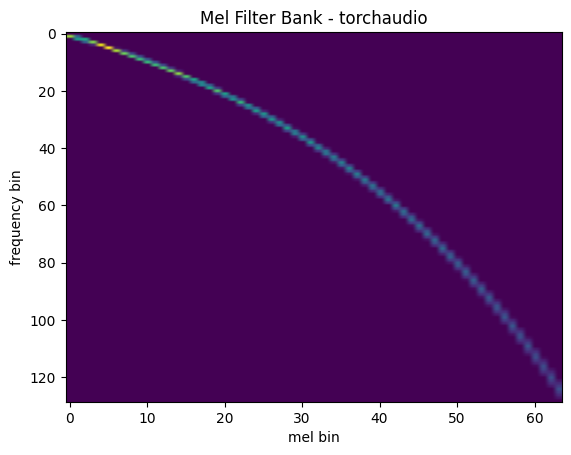

In [30]:
n_fft = 256
n_mels = 64
sample_rate = 6000

mel_filters = F.melscale_fbanks(
    int(n_fft // 2 + 1),
    n_mels=n_mels,
    f_min=0.0,
    f_max=sample_rate / 2.0,
    sample_rate=sample_rate,
    norm="slaney",
)

plot_fbank(mel_filters, "Mel Filter Bank - torchaudio")

Mean Square Difference:  3.934872696751886e-17


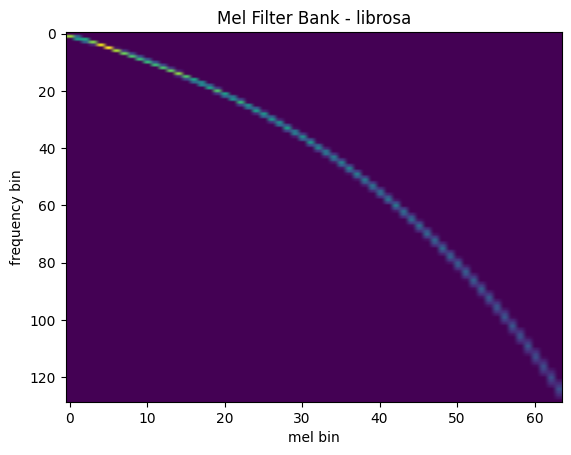

In [31]:
mel_filters_librosa = librosa.filters.mel(
    sr=sample_rate,
    n_fft=n_fft,
    n_mels=n_mels,
    fmin=0.0,
    fmax=sample_rate / 2.0,
    norm="slaney",
    htk=True,
).T

plot_fbank(mel_filters_librosa, "Mel Filter Bank - librosa")

mse = torch.square(mel_filters - mel_filters_librosa).mean().item()
print("Mean Square Difference: ", mse)

## 🧬 MelSpectrogram

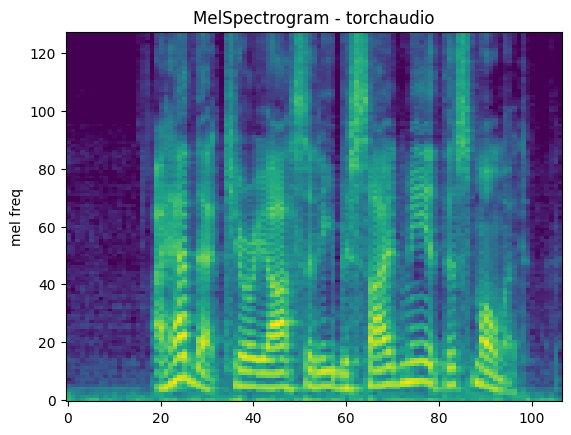

In [32]:
n_fft = 1024
win_length = None
hop_length = 512
n_mels = 128

mel_spectrogram = T.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    norm="slaney",
    n_mels=n_mels,
    mel_scale="htk",
)

melspec = mel_spectrogram(SPEECH_WAVEFORM)
plot_spectrogram(melspec[0], title="MelSpectrogram - torchaudio", ylabel="mel freq")

Mean Square Difference:  1.2880109201418577e-09


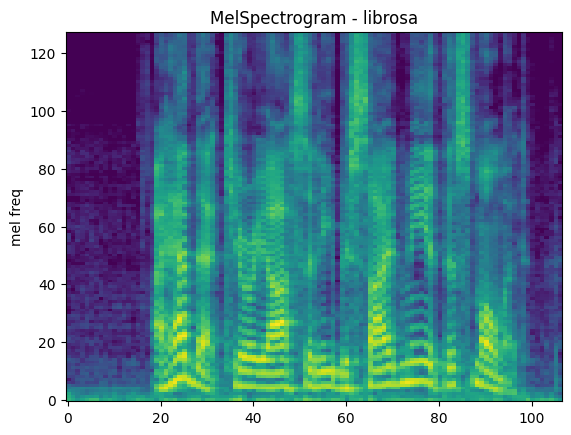

In [33]:
melspec_librosa = librosa.feature.melspectrogram(
    y=SPEECH_WAVEFORM.numpy()[0],
    sr=sample_rate,
    n_fft=n_fft,
    hop_length=hop_length,
    win_length=win_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    n_mels=n_mels,
    norm="slaney",
    htk=True,
)
plot_spectrogram(melspec_librosa, title="MelSpectrogram - librosa", ylabel="mel freq")

mse = torch.square(melspec - melspec_librosa).mean().item()
print("Mean Square Difference: ", mse)

### ⚛ MFCC

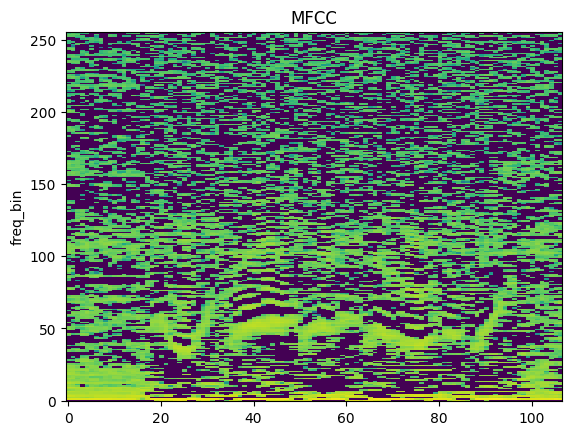

In [34]:
n_fft = 2048
win_length = None
hop_length = 512
n_mels = 256
n_mfcc = 256

mfcc_transform = T.MFCC(
    sample_rate=sample_rate,
    n_mfcc=n_mfcc,
    melkwargs={
        "n_fft": n_fft,
        "n_mels": n_mels,
        "hop_length": hop_length,
        "mel_scale": "htk",
    },
)

mfcc = mfcc_transform(SPEECH_WAVEFORM)
plot_spectrogram(mfcc[0], title="MFCC")

Mean Square Difference:  0.8103960752487183


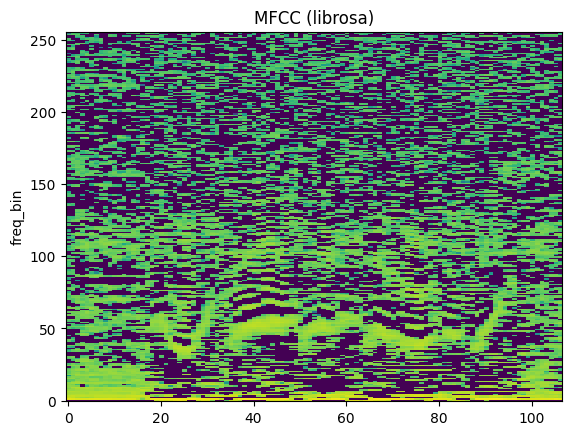

In [35]:
melspec = librosa.feature.melspectrogram(
    y=SPEECH_WAVEFORM.numpy()[0],
    sr=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    n_mels=n_mels,
    htk=True,
    norm=None,
)

mfcc_librosa = librosa.feature.mfcc(
    S=librosa.core.spectrum.power_to_db(melspec),
    n_mfcc=n_mfcc,
    dct_type=2,
    norm="ortho",
)
plot_spectrogram(mfcc_librosa, title="MFCC (librosa)")

mse = torch.square(mfcc - mfcc_librosa).mean().item()
print("Mean Square Difference: ", mse)

### 🎮🕹️👾LFCC

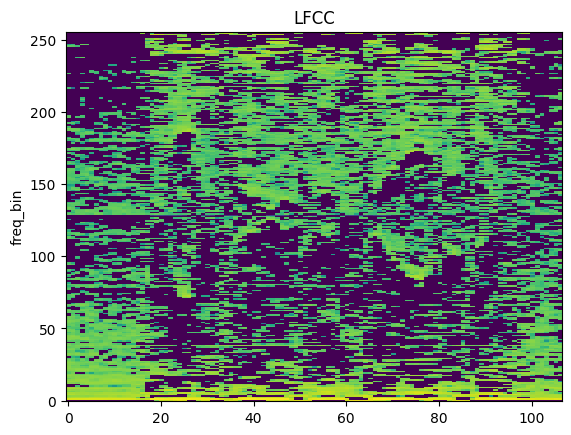

In [36]:
n_fft = 2048
win_length = None
hop_length = 512
n_lfcc = 256

lfcc_transform = T.LFCC(
    sample_rate=sample_rate,
    n_lfcc=n_lfcc,
    speckwargs={
        "n_fft": n_fft,
        "win_length": win_length,
        "hop_length": hop_length,
    },
)

lfcc = lfcc_transform(SPEECH_WAVEFORM)
plot_spectrogram(lfcc[0], title="LFCC")

### ▶• ılıılıılılılııılıılı.Practice with Pitch

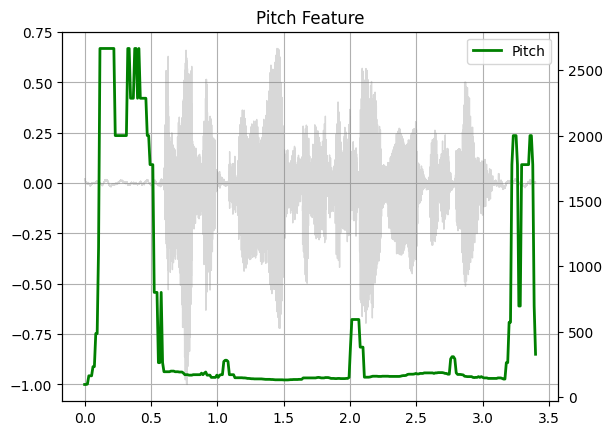

In [37]:
pitch = F.detect_pitch_frequency(SPEECH_WAVEFORM, SAMPLE_RATE)
def plot_pitch(waveform, sr, pitch):
    figure, axis = plt.subplots(1, 1)
    axis.set_title("Pitch Feature")
    axis.grid(True)

    end_time = waveform.shape[1] / sr
    time_axis = torch.linspace(0, end_time, waveform.shape[1])
    axis.plot(time_axis, waveform[0], linewidth=1, color="gray", alpha=0.3)

    axis2 = axis.twinx()
    time_axis = torch.linspace(0, end_time, pitch.shape[1])
    axis2.plot(time_axis, pitch[0], linewidth=2, label="Pitch", color="green")

    axis2.legend(loc=0)


plot_pitch(SPEECH_WAVEFORM, SAMPLE_RATE, pitch)

## 🔢 Переписываем текущую нейронную сеть с PyTorch на NumPy

In [ ]:
# Инсталяция и импорт новых модулей
!pip install scipy
print(f"NumPy version: {np.__version__}")
from scipy.io import wavfile
from scipy.interpolate import interp1d

In [110]:
class GigaAM_V2_0:
    """
    Giga Acoustic Model: Self-Supervised Model for Speech Tasks
    """
    # Функция основывыется на utils из библиотеки Hydra - нужно ли это переписывать
    def __init__(self,
                 cfg: Dict):
        # super().__init__()
        self.cfg = cfg
        # self.preprocessor = hydra.utils.instantiate(self.cfg.preprocessor)
        self.encoder = hydra.utils.instantiate(self.cfg.encoder)
        self.preprocessor = FeatureExtractor1(
            sample_rate=cfg.get("sample_rate", MY_CONSTANTS.SAMPLEnit_RATE),
            features=cfg.get("features", MY_CONSTANTS.FEAT_IN)
        )
        # # Предполагаем, что энкодер — это заглушка (нужно реализовать отдельно)
        # self.encoder = DummyEncoder(feat_in=MY_CONSTANTS.FEAT_IN, d_model=MY_CONSTANTS.D_MODEL)

    def forward(self,
                features: np.ndarray,
                feature_lengths: np.ndarray) -> np.ndarray:
        features, feature_lengths = self.preprocessor(features, feature_lengths)
        return self.encoder(features, feature_lengths)

    def prepare_wav(self,
                    wav_file: str) -> Tuple[np.ndarray, np.ndarray]:
        wav = load_audio(wav_file)  # Используем новую функцию load_audio
        wav = wav[np.newaxis, :]  # Добавляем batch-размерность: [1, T]
        length = np.array([wav.shape[-1]], dtype=np.int64)
        return wav, length

    def embed_audio(self,
                    wav_file: str) -> Tuple[np.ndarray, np.ndarray]:
        wav, length = self.prepare_wav(wav_file)
        encoded, encoded_len = self.forward(wav, length)
        return encoded, encoded_len

    # Нужно ли переписывать Tensor
    # def forward(
    #     self,
    #     features: Tensor,
    #     feature_lengths: Tensor,
    # ) -> Tensor:
    #     """
    #     Perform forward pass through the preprocessor and encoder.
    #     """
    #     features, feature_lengths = self.preprocessor(features, feature_lengths)
    #     if self._device.type == "cpu":
    #         return self.encoder(features, feature_lengths)
    #     with torch.autocast(device_type=self._device.type, dtype=torch.float16):
    #         return self.encoder(features, feature_lengths)


    # def _device(self) -> torch.device:
    #     return next(self.parameters()).device


    # def _dtype(self) -> torch.dtype:
    #     return next(self.parameters()).dtype

    # def prepare_wav(self,
    #                 wav_file: str) -> Tuple[Tensor, Tensor]:
    #     """
    #     Prepare an audio file for processing by loading it onto
    #     the correct device and converting its format.
    #     """
    #     wav = load_audio(wav_file)
    #     wav = wav.to(self._device).to(self._dtype).unsqueeze(0)
    #     length = torch.full([1], wav.shape[-1], device=self._device)
    #     return wav, length

    # def embed_audio(self,
    #                 wav_file: str) -> Tuple[Tensor, Tensor]:
    #     """
    #     Extract audio representations using the GigaAM model.
    #     """
    #     wav, length = self.prepare_wav(wav_file)
    #     encoded, encoded_len = self.forward(wav, length)
    #     return encoded, encoded_len

    # def to_onnx(self,
    #             dir_path: str = ".") -> None:
    #     """
    #     Export onnx model encoder to the specified dir.
    #     """
    #     onnx_converter(
    #         model_name=f"{self.cfg.model_name}_encoder",
    #         out_dir=dir_path,
    #         module=self.encoder,
    #         dynamic_axes=self.encoder.dynamic_axes(),
    #     )

NumPy version: 1.26.4


In [111]:
class GigaAMASR_V2_0(GigaAM_V2_0):
    """
    Giga Acoustic Model for Speech Recognition
    """
    # Снова Hydra utils
    def __init__(self,
                 cfg: omegaconf.DictConfig):
        super().__init__(cfg)
        # self.head = hydra.utils.instantiate(self.cfg.head)  # CTCHead
        # self.decoding = hydra.utils.instantiate(self.cfg.decoding)  # CTCGreedyDecoding
        self.head = CTCHead(
            feat_in=MY_CONSTANTS.FEAT_IN,
            num_classes=len(VOCAB) + 1  # +1 для blank
        )
        self.decoding = CTCGreedyDecoding(vocabulary=VOCAB)

    def forward_for_export(self,
                           features: np.ndarray,
                           feature_lengths: np.ndarray) -> np.ndarray:
        encoded, _ = self.encoder(features, feature_lengths)
        return self.head(encoded)

In [112]:
class Tokenizer_V2_0:
    """
    Tokenizer for converting between text and token IDs.
    The tokenizer can operate either character-wise or using a pre-trained SentencePiece model.
    """

    def __init__(self,
                 vocab: List[str],
                 model_path: Optional[str] = None):
        self.charwise = model_path is None
        if self.charwise:
            self.vocab = vocab
        else:
            # используется аргумент из библиотеки SentencePieceProcessor
            self.model = SentencePieceProcessor()
            self.model.load(model_path)

    def decode(self,
               tokens: List[int]) -> str:
        """
        Convert a list of token IDs back to a string.
        """
        if self.charwise:
            return "".join(self.vocab[tok] for tok in tokens)
        return self.model.decode(tokens)

    def __len__(self):
        """
        Get the total number of tokens in the vocabulary.
        """
        return len(self.vocab) if self.charwise else len(self.model)

In [113]:
# Рефакторед
class SpecScaler_V2_0:
    """
    Module that applies logarithmic scaling to spectrogram values.
    This module clamps the input values within a certain range and then applies a natural logarithm.
    """

    def forward(self,
                x: np.ndarray) -> np.ndarray:
        # return torch.log(x.clamp_(1e-9, 1e9))
        return np.log(np.clip(x, 1e-9, 1e9))

    def __call__(self, x: np.ndarray) -> np.ndarray:
        """Делает класс вызываемым, перенаправляя вызов на forward."""
        return self.forward(x)

In [114]:
# Рефакторед
class CTCHead_V2_0:
    """
    CTC Head module for Connectionist Temporal Classification.
    """

    def __init__(self,
                 feat_in: int,
                 num_classes: int):
        # super().__init__()
        # self.decoder_layers = torch.nn.Sequential(
        #     torch.nn.Conv1d(feat_in, num_classes, kernel_size=1)
        # )
        self.feat_in = feat_in
        self.num_classes = num_classes
        # Случайная инициализация весов (как в PyTorch по умолчанию)
        self.weights = np.random.randn(feat_in, num_classes) * np.sqrt(2.0 / feat_in)
        self.bias = np.zeros(num_classes)

    def forward(self,
                encoder_output: np.ndarray) -> np.ndarray:
        # return torch.nn.functional.log_softmax(
        #     self.decoder_layers(encoder_output).transpose(1, 2), dim=-1
        # )
        # encoder_output: [B, T, feat_in] -> нужно транспонировать в [B, feat_in, T] для свёртки
        x = encoder_output.transpose(0, 2, 1)  # [B, feat_in, T]

        # Свёртка 1x1 эквивалентна матричному умножению по каналам
        # [B, feat_in, T] @ [feat_in, num_classes] -> [B, num_classes, T]
        conv_output = np.matmul(x.transpose(0, 2, 1), self.weights) + self.bias  # [B, T, num_classes]

        # Транспонируем для log_softmax: [B, T, num_classes] -> [B, T, C]
        conv_output = conv_output.transpose(0, 1, 2)

        # Вычисление log_softmax
        def log_softmax(x):
            x_max = np.max(x, axis=-1, keepdims=True)  # Для численной стабильности
            exp_x = np.exp(x - x_max)
            sum_exp_x = np.sum(exp_x, axis=-1, keepdims=True)
            return x - x_max - np.log(sum_exp_x)

        return log_softmax(conv_output)

In [115]:
# Класс жадного декодирования для CTC
class CTCGreedyDecoding_V2_0:
    # Инициализация
    def __init__(self,
                 vocabulary: List[str],
                 model_path: Optional[str] = None):
        self.tokenizer = Tokenizer_V2_0(vocabulary, model_path)
        self.blank_id = len(self.tokenizer)

    # Декодирование
    @torch.inference_mode()
    def decode(self,
               head: CTCHead_V2_0,
               encoded: np.ndarray,
               lengths: np.ndarray) -> List[str]:
        """
        Decode the output of a CTC model into a list of hypotheses.
        """
        log_probs = head(encoder_output=encoded)
        assert (
            len(log_probs.shape) == 3
        ), f"Expected log_probs shape {log_probs.shape} == [B, T, C]"
        b, _, c = log_probs.shape
        assert (
            c == len(self.tokenizer) + 1
        ), f"Num classes {c} != len(vocab) + 1 {len(self.tokenizer) + 1}"

        # labels = log_probs.argmax(dim=-1, keepdim=False)
        labels = np.argmax(log_probs, axis=-1)  # [B, T]

        skip_mask = labels != self.blank_id
        # skip_mask[:, 1:] = torch.logical_and(
        #     skip_mask[:, 1:], labels[:, 1:] != labels[:, :-1]
        # )
        skip_mask[:, 1:] = np.logical_and(
            skip_mask[:, 1:], labels[:, 1:] != labels[:, :-1]
        )
        # for length in lengths:
        #     skip_mask[length:] = 0

        # Применяем длины последовательностей
        for i, length in enumerate(lengths):
            skip_mask[i, length:] = 0

        # pred_texts: List[str] = []
        # for i in range(b):
        #     pred_texts.append(
        #         "".join(self.tokenizer.decode(labels[i][skip_mask[i]].cpu().tolist()))
        #     )

        pred_texts: List[str] = []
        for i in range(b):
            token_ids = labels[i][skip_mask[i]].tolist()
            pred_texts.append("".join(self.tokenizer.decode(token_ids)))
        return pred_texts

In [117]:
# Функция для выкачки файла
def _download_file_V2_0(file_url: str,
                   file_path: str) -> str:
    """Helper to download a file if not already cached."""
    if os.path.exists(file_path):
        return file_path

    os.makedirs(os.path.dirname(file_path), exist_ok=True)

    with urllib.request.urlopen(file_url) as source, open(file_path, "wb") as output:
        with tqdm(
            total=int(source.info().get("Content-Length", 0)),
            ncols=80,
            unit="iB",
            unit_scale=True,
            unit_divisor=1024,
        ) as loop:
            while True:
                buffer = source.read(8192)
                if not buffer:
                    break

                output.write(buffer)
                loop.update(len(buffer))

    return file_path

# Функция для выкачки модели
def _download_model_V2_0(model_name: str,
                    download_root: str) -> Tuple[str, str]:
    """Download the model weights if not already cached."""
    if model_name not in _MODEL_NAMES:
        raise ValueError(
            f"Model '{model_name}' not found. Available model names: {_MODEL_NAMES}"
        )

    if model_name in ["ctc", "rnnt", "ssl"]:
        model_name = f"v2_{model_name}"
    model_url = f"{MY_CONSTANTS._URL_DIR}/{model_name}.ckpt"
    model_path = os.path.join(download_root, model_name + ".ckpt")
    return model_name, _download_file_V2_0(model_url, model_path)

# Функция для выкачки токенайзера
def _download_tokenizer_V2_0(model_name: str,
                        download_root: str) -> Optional[str]:
    """Download the tokenizer if required and return its path."""
    if model_name != "v1_rnnt":
        return None  # No tokenizer required for this model

    tokenizer_url = f"{MY_CONSTANTS._URL_DIR}/{model_name}_tokenizer.model"
    tokenizer_path = os.path.join(download_root, model_name + "_tokenizer.model")
    return _download_file_V2_0(tokenizer_url, tokenizer_path)

# Загрузка модели (для CTC)
def load_model_V2_0(
    model_name: str,
    fp16_encoder: bool = True,
    use_flash: Optional[bool] = False,
    device: Optional[Union[str, torch.device]] = None,
    download_root: Optional[str] = None,
) -> Union[GigaAM_V2_0, GigaAMASR_V2_0]:
    """
    Load the GigaAM model by name.

    Parameters
    ----------
    model_name : str
        The name of the model to load.
    fp16_encoder:
        Whether to convert encoder weights to FP16 precision.
    use_flash : Optional[bool]
        Whether to use flash_attn if the model allows it (requires the flash_attn library installed).
        Default to False.
    device : Optional[Union[str, torch.device]]
        The device to load the model onto. Defaults to "cuda" if available, otherwise "cpu".
    download_root : Optional[str]
        The directory to download the model to. Defaults to "~/.cache/gigaam".
    """

    if device != "cpu":
      logging.warning("Only 'cpu' is supported in NumPy version. Ignoring device argument.")

    if download_root is None:
        download_root = os.path.expanduser("~/.cache/gigaam")

    model_name, model_path = _download_model_V2_0(model_name, download_root)
    tokenizer_path = _download_tokenizer_V2_0(model_name, download_root)

    # checkpoint = torch.load(model_path, map_location="cpu")

    # Загрузка весов (предполагаем .npy формат)
    checkpoint = np.load(model_path, allow_pickle=True).item()

    cfg = checkpoint.get("cfg", {
        "sample_rate": MY_CONSTANTS.SAMPLE_RATE,
        "features": MY_CONSTANTS.FEAT_IN,
        "model_name": model_name
    })

    # if use_flash is not None:
    #     checkpoint["cfg"].encoder.flash_attn = use_flash
    # if checkpoint["cfg"].encoder.get("flash_attn", False) and device.type == "cpu":
    #     logging.warning("flash_attn is not supported on CPU. Disabling it...")
    #     checkpoint["cfg"].encoder.flash_attn = False

    # if tokenizer_path is not None:
    #     checkpoint["cfg"].decoding.model_path = tokenizer_path

    # if "ssl" in model_name:
    #     model = GigaAM_V2_0(checkpoint["cfg"])
    # else:
    #     model = GigaAMASR_V2_0(checkpoint["cfg"])

    # model.load_state_dict(checkpoint["state_dict"], strict=False)
    # model = model.eval()

    # if fp16_encoder and device.type != "cpu":
    #     model.encoder = model.encoder.half()
    # elif fp16_encoder:
    #     logging.warning("fp16 is not supported on CPU. Leaving fp32 weights...")

    # checkpoint["cfg"].model_name = model_name
    # return model.to(device)

    if use_flash is not None:
        cfg["encoder_flash_attn"] = use_flash
    if cfg.get("encoder_flash_attn", False):
        logging.warning("flash_attn not supported in NumPy. Disabling it...")
        cfg["encoder_flash_attn"] = False
    if tokenizer_path is not None:
        cfg["decoding_model_path"] = tokenizer_path

    # Создание модели
    if "ssl" in model_name:
        model = GigaAM_V2_0(cfg)
    else:
        model = GigaAMASR_V2_0(cfg)

    # Загрузка весов
    state_dict = checkpoint.get("state_dict", {})
    if "encoder.weights" in state_dict:
        model.encoder.weights = state_dict["encoder.weights"]
        model.encoder.bias = state_dict["encoder.bias"]
    if "head.weights" in state_dict:
        model.head.weights = state_dict["head.weights"]
        model.head.bias = state_dict["head.bias"]

    return model

Inputs expected by the model:
Input name: features, Shape: ['batch_size', 64, 'seq_len']
Input name: feature_lengths, Shape: ['batch_size']
Outputs of the model:
Output name: log_probs, Shape: ['batch_size', 'seq_len', 34]
Audio shape: (173952,)
Original shape from wavfile: (521856, 2), sample rate: 48000
Shape after conversion to float32: (521856, 2)
Shape after transpose: (2, 521856)
Аудио СТЕРЕО -> МОНО (левый канал)
Shape after channel processing: (1, 521856)
Shape after resampling: (1, 173952)
Audio shape: (1, 173952)
Original shape from wavfile: (521856, 2), sample rate: 48000
Shape after conversion to float32: (521856, 2)
Shape after transpose: (2, 521856)
Аудио уже СТЕРЕО
Shape after channel processing: (2, 521856)
Shape after resampling: (2, 173952)
Audio shape (stereo): (2, 173952)
Audio shape 2: (2, 173952)
Диапазон значений итогового аудио -1.0 0.999969482421875
Максимальное расхождение для первого примера (моно): 1.6325936103306553
Максимальное расхождение для второго прим

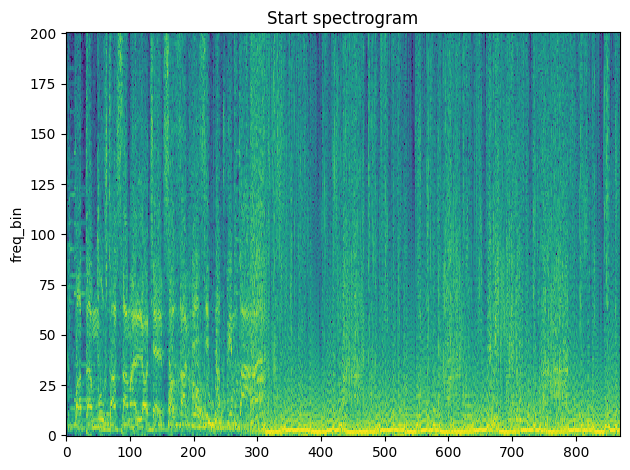

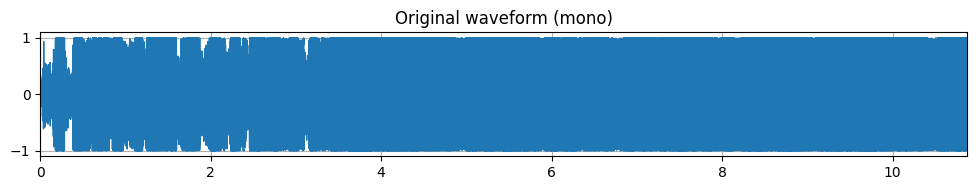

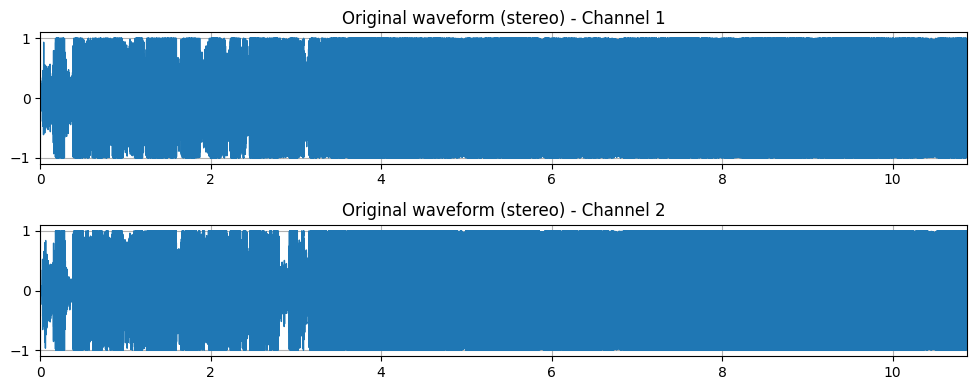

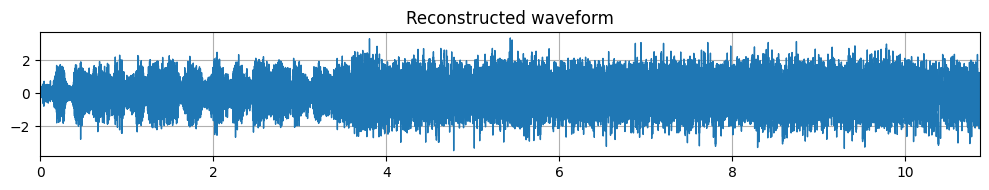

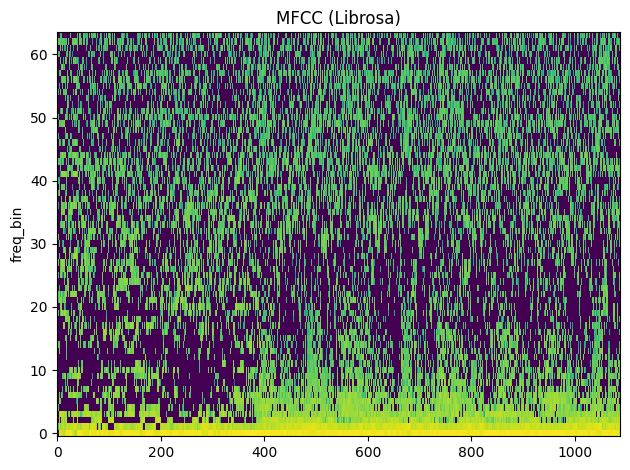

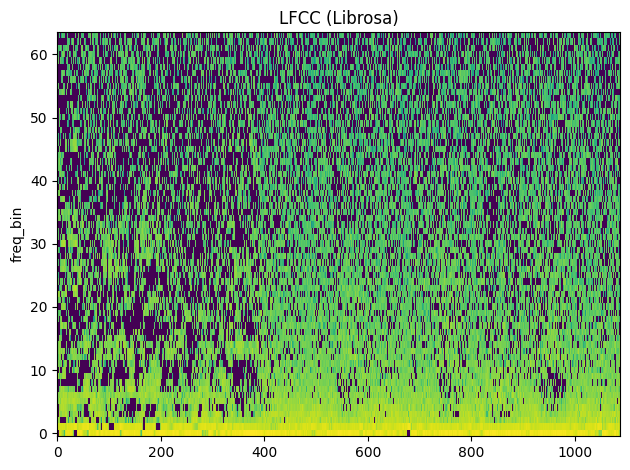

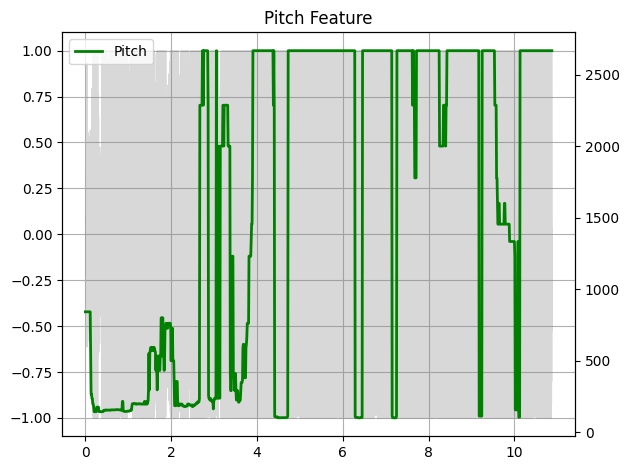

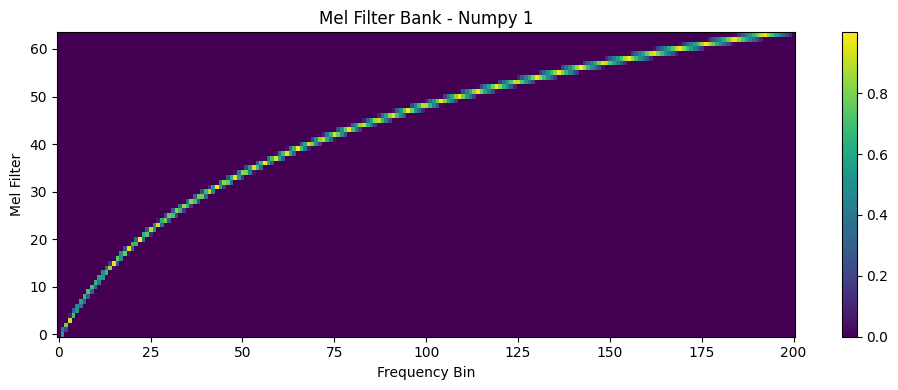

Shape: (1, 64, 1085)
Data type: float32
Min value: -11.468908
Max value: 9.316121
Mean value: 3.392534
Std deviation: 2.1067173
Фича 1: min=-9.7049, max=8.8308, mean=5.1523
Фича 2: min=-9.9328, max=8.8297, mean=6.1895
Фича 3: min=-11.4689, max=9.3161, mean=6.8670
Фича 4: min=-9.5868, max=9.3007, mean=6.7728
Фича 5: min=-11.1663, max=9.0824, mean=6.2256
Фича 6: min=-10.6279, max=8.9006, mean=5.9645
Фича 7: min=-9.3334, max=8.7012, mean=5.7139
Фича 8: min=-8.8881, max=8.2371, mean=5.5160
Фича 9: min=-9.4651, max=8.4273, mean=5.3026
Фича 10: min=-9.8549, max=8.5082, mean=5.0577
Фича 11: min=-9.1751, max=8.3042, mean=4.8099
Фича 12: min=-9.7108, max=8.0131, mean=4.7595
Фича 13: min=-9.9944, max=8.0852, mean=4.5012
Фича 14: min=-10.2077, max=8.1061, mean=4.3699
Фича 15: min=-11.3936, max=8.5765, mean=4.3766
Фича 16: min=-10.6269, max=9.1987, mean=4.4622
Фича 17: min=-11.2553, max=8.6757, mean=4.0928
Фича 18: min=-10.6697, max=7.8319, mean=3.9232
Фича 19: min=-9.1320, max=8.2521, mean=4.0433

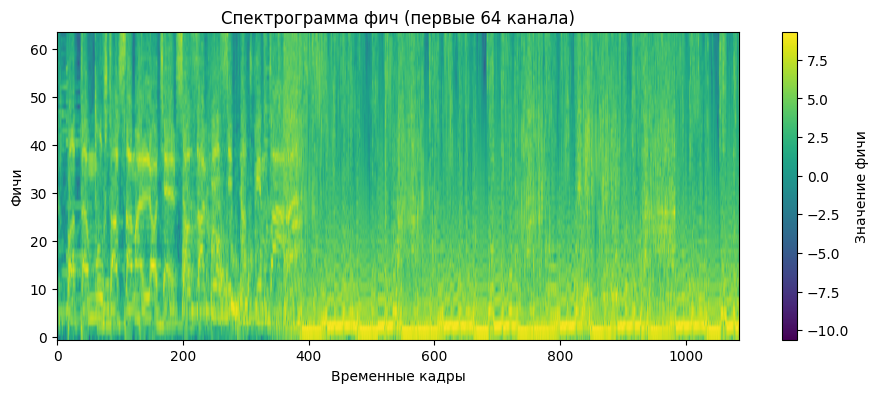

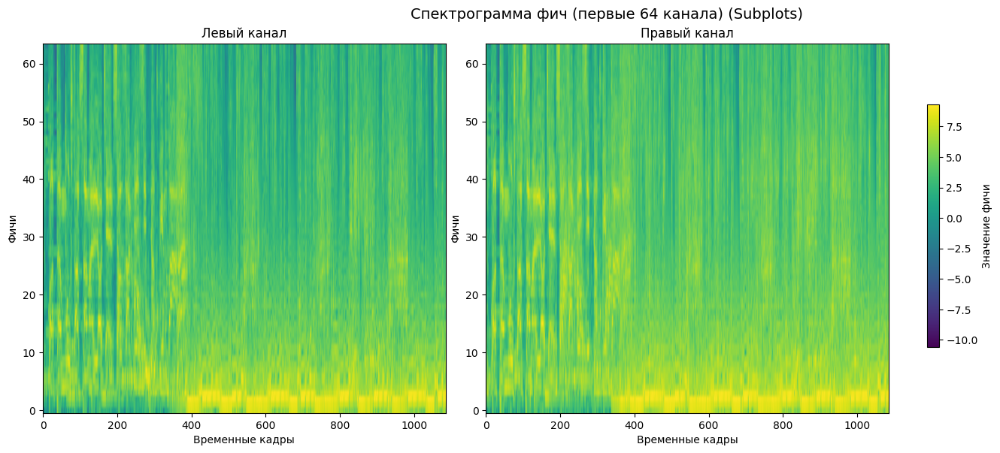

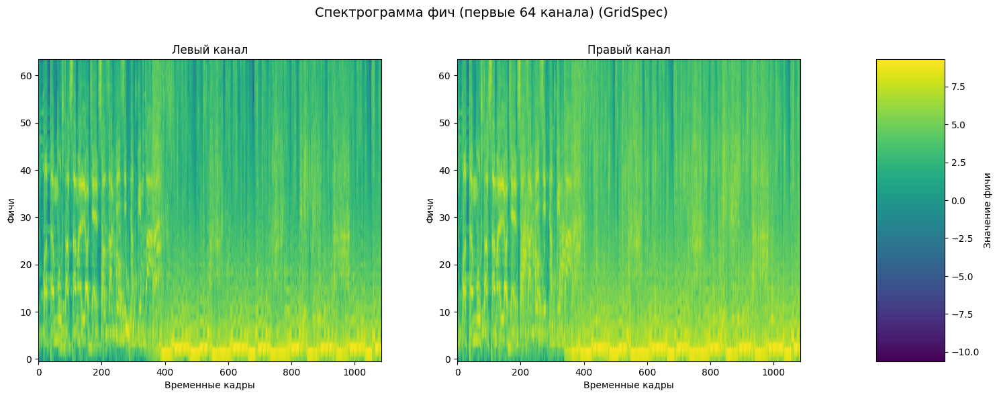

Log probs shape: (1, 272, 34)
Predicted token indices: [33, 33, 33, 33, 33, 33, 16, 15, 33, 33, 19, 15, 33, 13, 13, 20, 0, 0, 24, 24, 19, 15, 0, 0, 0, 0, 3, 0, 0, 18, 18, 1, 33, 13, 15, 33, 33, 12, 6, 33, 33, 19, 6, 33, 33, 33, 33, 0, 0, 3, 18, 18, 6, 33, 0, 0, 0, 33, 8, 1, 33, 33, 3, 9, 33, 33, 18, 9, 33, 19, 33, 33, 0, 0, 33, 15, 19, 0, 0, 33, 3, 9, 33, 14, 33, 33, 19, 1, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33,

In [122]:
class FeatureExtractor_V2_0:
    """
    Module for extracting Log-mel spectrogram features from raw audio signals.
    This module uses Torchaudio's MelSpectrogram transform to extract features
    and applies logarithmic scaling.
    """
    def __init__(self,
                 sample_rate: int,
                 features: int):
        self.sample_rate = sample_rate
        self.features = features
        self.hop_length = sample_rate // 100
        self.n_fft = sample_rate // 40
        self.win_length = sample_rate // 40

        self.mel_fb = self._create_mel_filterbank()
        self.spec_scaler = SpecScaler_V2_0()

    def _create_mel_filterbank(self) -> np.ndarray:
        # Простая реализация мел-фильтров (линейная аппроксимация)
        n_freqs = int(self.n_fft // 2 + 1)
        f_min, f_max = 0.0, self.sample_rate / 2.0
        mel_min = 1125.0 * np.log1p(f_min / 700.0)
        mel_max = 1125.0 * np.log1p(f_max / 700.0)
        mel_points = np.linspace(mel_min, mel_max, self.features + 2)
        freq_points = 700.0 * (np.expm1(mel_points / 1125.0))

        fb = np.zeros((self.features, n_freqs))
        freqs = np.linspace(0, f_max, n_freqs)
        for m in range(self.features):
            f_left = freq_points[m]
            f_center = freq_points[m + 1]
            f_right = freq_points[m + 2]
            for f in range(n_freqs):
                if f_left <= freqs[f] <= f_center:
                    fb[m, f] = (freqs[f] - f_left) / (f_center - f_left)
                elif f_center < freqs[f] <= f_right:
                    fb[m, f] = (f_right - freqs[f]) / (f_right - f_center)
        return fb

    def forward(self,
                 input_signal: np.ndarray,
                 length: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        # input_signal: [B, channels, T] или [B, T]
        if input_signal.ndim == 2:
            input_signal = input_signal[:, np.newaxis, :]  # Добавляем канал

        batch_size, channels, time = input_signal.shape
        num_frames = (time - self.n_fft) // self.hop_length + 1

        # Окно Ханна
        window = 0.5 - 0.5 * np.cos(2.0 * np.pi * np.arange(self.win_length) / (self.win_length - 1))

        # Вычисление STFT вручную
        spectrogram = []
        for b in range(batch_size):
            for c in range(channels):
                signal = input_signal[b, c]
                frames = []
                for i in range(num_frames):
                    start = i * self.hop_length
                    frame = signal[start:start + self.n_fft]
                    if len(frame) < self.n_fft:
                        frame = np.pad(frame, (0, self.n_fft - len(frame)))
                    frame = frame * window[:len(frame)]
                    fft = np.fft.rfft(frame, n=self.n_fft)
                    power = np.abs(fft) ** 2
                    frames.append(power)
                spectrogram.append(np.stack(frames, axis=0))
        spectrogram = np.stack(spectrogram, axis=0).reshape(batch_size, channels, num_frames, -1)
        # spectrogram = np.stack(spectrogram, axis=0)  # [B, channels, T, n_freqs]

        # Применение мел-фильтров
        mel_spec = np.matmul(spectrogram, self.mel_fb.T)  # [B, channels, T, n_mels]
        mel_spec = mel_spec.transpose(0, 1, 3, 2)  # [B, channels, n_mels, T]

        # Логарифмическое масштабирование
        mel_spec = self.spec_scaler(mel_spec)

        # Убираем лишнюю размерность для моно
        if channels == 1:
            mel_spec = mel_spec.squeeze(1)  # [B, n_mels, T]

        return mel_spec, self.out_len(length)

        # def forward(self,
    #             input_signal: Tensor,
    #             length: Tensor) -> Tuple[Tensor, Tensor]:
    #     """
    #     Extract Log-mel spectrogram features from the input audio signal.
    #     """

    #     spectrogram = torchaudio.functional.spectrogram(
    #         waveform=input_signal,
    #         pad=0,
    #         n_fft=self.n_fft,
    #         win_length=self.win_length,
    #         hop_length=self.hop_length,
    #         window=torch.hann_window(self.win_length, device=input_signal.device),
    #         power=2.0,
    #         normalized=False,
    #         # onesided=True,
    #         # center=True,
    #         # pad_mode="reflect",
    #         # return_complex=False,
    #     )

    #     # mel_spec = torch.matmul(spectrogram.pow(2.0).transpose(-1, -2), self.mel_fb.to(spectrogram.device))
    #     mel_spec = torch.matmul(spectrogram.transpose(-2, -1), self.mel_fb).transpose(-2, -1)

    #     return self.spec_scaler(mel_spec), self.out_len(length)

    def __call__(self,
                 input_signal: np.ndarray,
                 length: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        """Делает класс вызываемым, перенаправляя вызов на forward."""
        return self.forward(input_signal, length)

    # def plot_fbank(self,
    #                mel_filters: np.ndarray,
    #                title: str):
    #     """Plot the filter bank.

    #     Args:
    #         mel_filters (Tensor): The filter bank to plot.
    #         title (str): The title of the plot.
    #     """
    #     plt.figure(figsize=(10, 4))
    #     plt.imshow(mel_filters, aspect="auto", origin="lower")
    #     plt.title(title)
    #     plt.xlabel("Frequency Bin")
    #     plt.ylabel("Mel Filter")
    #     plt.colorbar()
    #     plt.tight_layout()
    #     plt.show()


    # def out_len(self,
    #             input_lengths: Tensor) -> Tensor:
    #     """
    #     Calculates the output length after the feature extraction process.
    #     """
    #     return input_lengths.div(self.hop_length, rounding_mode="floor").add(1).long()

    def out_len(self,
                input_lengths: np.ndarray) -> np.ndarray:
        """
        Calculates the output length after the feature extraction process.
        """
        return (input_lengths // self.hop_length + 1).astype(np.int64)

class NumpyGraphicsModule:
    def plot_fbank(mel_filters: np.ndarray,
                   title: str)-> None:
        """Plot the filter bank.

        Args:
            mel_filters (Tensor): The filter bank to plot.
            title (str): The title of the plot.
        """
        plt.figure(figsize=(10, 4))
        plt.imshow(mel_filters, aspect="auto", origin="lower")
        plt.title(title)
        plt.xlabel("Frequency Bin")
        plt.ylabel("Mel Filter")
        plt.colorbar()
        plt.tight_layout()
        plt.show()

    """
    Функция для построения графика моноканала.
    """
    def mono_graph_V2_0(features: np.ndarray) -> None:
        plt.figure(figsize=(11, 4))
        plt.imshow(features[0], aspect='auto', origin='lower', cmap='viridis')
        plt.colorbar(label='Значение фичи')
        plt.xlabel('Временные кадры')
        plt.ylabel('Фичи')
        plt.title('Спектрограмма фич (первые 64 канала)')
        plt.show()

    """
    Функция для построения графика стереоканала (через subploats).
    """
    def stereo_subploats_graph_V2_0(features: np.ndarray) -> None:
        # Для примера: отображение первой фичи в батче (если features.shape = [1, 64, T])
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))  # 1 row, 2 columns
        # Левый канал
        im1 = axes[0].imshow(features[0][0], aspect='auto', origin='lower', cmap='viridis')
        axes[0].set_title('Левый канал')
        axes[0].set_xlabel('Временные кадры')
        axes[0].set_ylabel('Фичи')
        # Правый канал
        im2 = axes[1].imshow(features[0][1], aspect='auto', origin='lower', cmap='viridis')
        axes[1].set_title('Правый канал')
        axes[1].set_xlabel('Временные кадры')
        axes[1].set_ylabel('Фичи')
        fig.colorbar(im1, ax=axes, shrink=0.7, location='right', label='Значение фичи')
        fig.suptitle('Спектрограмма фич (первые 64 канала) (Subplots)', fontsize=14, y=0.98)
        plt.subplots_adjust(top=0.90, bottom=0.08, left=0, right=0.75, wspace=0.1)
        plt.show()

    """
    Функция для построения графика стереоканала (через GridSpec).
    """
    def stereo_gridspec_graph_V2_0(features: np.ndarray) -> None:
        fig = plt.figure(figsize=(15, 6))
        gs = GridSpec(1, 3, width_ratios=[1, 1, 0.2])  # 1 строка, 3 столбца, колорбар уже
        # Левый канал
        ax0 = plt.subplot(gs[0])
        im1 = ax0.imshow(features[0][0], aspect='auto', origin='lower', cmap='viridis')
        ax0.set_title('Левый канал')
        ax0.set_xlabel('Временные кадры')
        ax0.set_ylabel('Фичи')
        # Правый канал
        ax1 = plt.subplot(gs[1])
        im2 = ax1.imshow(features[0][1], aspect='auto', origin='lower', cmap='viridis')
        ax1.set_title('Правый канал')
        ax1.set_xlabel('Временные кадры')
        ax1.set_ylabel('Фичи')
        # Колорбар
        ax_cb = plt.subplot(gs[2])
        fig.colorbar(im1, cax=ax_cb, label='Значение фичи') #Передаём ось для колорбара
        # Общий заголовок
        fig.suptitle('Спектрограмма фич (первые 64 канала) (GridSpec)', fontsize=14, y=0.98)
        # Настройка расположения - убираем plt.tight_layout и plt.subplots_adjust
        gs.update(top=0.85, bottom=0.1, left=0.05, right=0.95, wspace=0.3)
        plt.show()

    def plot_waveform(waveform: np.ndarray,
                      sr: int,
                      title: Optional[str] = "Waveform",
                      ax: Optional[Axes] = None)-> None:
        if not isinstance(waveform, np.ndarray):
            raise ValueError("Waveform должен быть PyTorch-тензором или NumPy-массивом")

        # Обрабатываем размерности
        if waveform.ndim == 1:
            waveform = waveform[np.newaxis, :]  # Добавляем канал: (T,) -> (1, T)

        num_channels, num_frames = waveform.shape
        time_axis = np.arange(0, num_frames) / sr  # Используем NumPy вместо torch.arange

        if ax is None:
            _, ax = plt.subplots(num_channels, 1, figsize=(10, 2 * num_channels))

        # Если один канал, рисуем просто
        if num_channels == 1:
            ax.plot(time_axis, waveform[0], linewidth=1)
            ax.grid(True)
            ax.set_xlim([0, time_axis[-1]])
            ax.set_title(title)
        else:
            for ch in range(num_channels):
                ax[ch].plot(time_axis, waveform[ch], linewidth=1)
                ax[ch].grid(True)
                ax[ch].set_xlim([0, time_axis[-1]])
                ax[ch].set_title(f"{title} - Channel {ch + 1}")

        plt.tight_layout()

    def plot_spectrogram(specgram: np.ndarray,
                        title: Optional[str] = None,
                        ylabel: str = "freq_bin",
                        ax: Optional[Axes] = None) -> None:
        if not isinstance(specgram, np.ndarray):
            raise ValueError("specgram должен быть NumPy-массивом")

        if ax is None:
            _, ax = plt.subplots(1, 1)
        if title is not None:
            ax.set_title(title)
        ax.set_ylabel(ylabel)
        ax.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto", interpolation="nearest")
        plt.tight_layout()

    def plot_pitch(waveform: np.ndarray,
                  sr: float,
                  pitch: np.ndarray)-> None:

        if not isinstance(waveform, np.ndarray) or not isinstance(pitch, np.ndarray):
            raise ValueError("specgram должен быть NumPy-массивом")

        if waveform.ndim == 1:
            waveform = waveform[np.newaxis, :]  # Добавляем канал: (T,) -> (1, T)
        elif pitch.ndim == 1:
            pitch = pitch[np.newaxis, :]  # Добавляем канал: (T,) -> (1, T)

        figure, axis = plt.subplots(1, 1)
        axis.set_title("Pitch Feature")
        axis.grid(True)

        end_time = waveform.shape[1] / sr
        time_axis = torch.linspace(0, end_time, waveform.shape[1])
        axis.plot(time_axis, waveform[0], linewidth=1, color="gray", alpha=0.3)

        axis2 = axis.twinx()
        time_axis = torch.linspace(0, end_time, pitch.shape[1])
        axis2.plot(time_axis, pitch[0], linewidth=2, label="Pitch", color="green")

        axis2.legend(loc=0)
        plt.tight_layout()



# Первый вариант замены функции для аудио
def load_audio_new_V2_0(
    audio_path: str,
    sample_rate: int = MY_CONSTANTS.SAMPLE_RATE,
    return_format: str = "float",
    load_type: str = "mono"
) -> np.ndarray:
    # Загружаем аудио
    try:
        original_sample_rate, waveform = wavfile.read(audio_path)
        print(f"Original shape from wavfile: {waveform.shape}, sample rate: {original_sample_rate}")
    except Exception as e:
        raise ValueError(f"Ошибка при чтении аудиофайла: {e}")

    # Проверяем, что данные не пустые
    if waveform.size == 0:
        raise ValueError("Аудиофайл пустой или некорректный")

    # Конвертируем в float32
    waveform = waveform.astype(np.float32)
    print(f"Shape after conversion to float32: {waveform.shape}")

    # Исправляем ориентацию: wavfile.read возвращает (samples, channels), а нам нужно (channels, samples)
    if waveform.ndim == 2:
        waveform = waveform.T  # Транспонируем: (samples, channels) -> (channels, samples)
        print(f"Shape after transpose: {waveform.shape}")
    elif waveform.ndim == 1:
        print("Аудио моно, оставляем как есть")

    # Обработка каналов
    # if load_type == "mono":
    #     if waveform.ndim == 2:
    #         print("Аудио СТЕРЕО -> МОНО (левый канал)")
    #         waveform = waveform[0][np.newaxis, :]
    #     elif waveform.ndim == 1:
    #         print("Аудио уже МОНО")
    #         waveform = waveform[np.newaxis, :]
    #     else:
    #         raise ValueError(f"Неподдерживаемое количество каналов в аудио - ошибка МОНО: {waveform.shape}")
    # elif load_type == "stereo":
    #     if waveform.ndim == 1:
    #         print("Аудио МОНО -> СТЕРЕО (дублирование канала)")
    #         waveform = np.stack([waveform, waveform], axis=0)
    #     elif waveform.ndim == 2 and waveform.shape[0] == 1:
    #         print("Псевдо-МОНО -> СТЕРЕО (дублирование канала)")
    #         waveform = np.concatenate([waveform, waveform], axis=0)
    #     elif waveform.ndim == 2 and waveform.shape[0] == 2:
    #         print("Аудио уже СТЕРЕО")
    #         waveform = waveform
    #     elif waveform.ndim == 2 and waveform.shape[0] > 2:
    #         print(f"Аудио с {waveform.shape[0]} каналами -> СТЕРЕО (берём первые 2 канала)")
    #         waveform = waveform[:2, :]
    #     else:
    #         raise ValueError(f"Неподдерживаемое количество каналов в аудио - ошибка СТЕРЕО: {waveform.shape}")
    if load_type == "mono":
        if waveform.shape[0] > 1:
            print("Аудио СТЕРЕО -> МОНО (левый канал)")
            waveform = waveform[0:1, :]
        else:
            print("Аудио уже МОНО")
    elif load_type == "stereo":
        if waveform.shape[0] == 1:
            print("Аудио МОНО -> СТЕРЕО (дублирование канала)")
            waveform = np.concatenate([waveform, waveform], axis=0)
        elif waveform.shape[0] > 2:
            print(f"Аудио с {waveform.shape[0]} каналами -> СТЕРЕО (берём первые 2 канала)")
            waveform = waveform[:2, :]
        else:
            print("Аудио уже СТЕРЕО")
    print(f"Shape after channel processing: {waveform.shape}")

    # Ресемплинг
    if original_sample_rate != sample_rate:
        old_length = waveform.shape[-1]
        new_length = int(old_length * sample_rate / original_sample_rate)
        if new_length <= 0:
            raise ValueError(f"Ошибка ресемплинга: новая длина = {new_length}")
        old_t = np.linspace(0, old_length - 1, old_length)
        new_t = np.linspace(0, old_length - 1, new_length)
        interpolator = interp1d(old_t, waveform, axis=-1, kind='linear')
        waveform = interpolator(new_t)
        print(f"Shape after resampling: {waveform.shape}")

    # Нормализация
    if return_format == "float":
        waveform = waveform / 32768.0

    return waveform

# Первоначальная функция для преобразования аудио (PyTorch вариант)
def load_audio_prev(
    audio_path: str,
    sample_rate: int = MY_CONSTANTS.SAMPLE_RATE,
    return_format: str = "float"
) -> np.ndarray:
    cmd = [
        "ffmpeg",
        "-nostdin",
        "-threads", "0",
        "-i", audio_path,
        "-f", "s16le",
        "-ac", "1",
        "-acodec", "pcm_s16le",
        "-ar", str(sample_rate),
        "-"
    ]
    try:
        audio_bytes = run(cmd, capture_output=True, check=True).stdout
    except CalledProcessError as exc:
        print(f"Ошибка ffmpeg: {exc.stderr.decode()}")
        raise RuntimeError("Failed to load audio") from exc

    # Конвертируем байты в массив NumPy
    audio = np.frombuffer(audio_bytes, dtype=np.int16)

    if return_format == "float":
        return audio.astype(np.float32) / 32768.0
    return audio
"""
Функция по выдаче статистики по каждому из каналов.
"""
def print_statistic_data_V2_0(features: np.ndarray) -> None:
    print("Shape:", features.shape)  # Размерность (например, [1, 64, T] для batch=1)
    print("Data type:", features.dtype)  # Тип данных (np.float32)
    print("Min value:", np.min(features))  # Минимальное значение
    print("Max value:", np.max(features))  # Максимальное значение
    print("Mean value:", np.mean(features))  # Среднее значение
    print("Std deviation:", np.std(features))  # Стандартное отклонение

    for i in range(features.shape[1]):  # для каждого из 64 признаков
      channel = features[0, i, :]
      print(f"Фича {i+1}: min={np.min(channel):.4f}, max={np.max(channel):.4f}, mean={np.mean(channel):.4f}")


def create_linear_filters(n_filters: int,
                          n_fft: int,
                          fmin: float,
                          fmax: float,
                          freqs: np.ndarray) -> np.ndarray:
    filters = np.zeros((n_filters, len(freqs)))
    filter_points = np.linspace(fmin, fmax, n_filters + 2)  # Границы фильтров

    for i in range(n_filters):
        left = filter_points[i]
        center = filter_points[i + 1]
        right = filter_points[i + 2]

        # Левый склон
        left_mask = (freqs >= left) & (freqs <= center)
        filters[i, left_mask] = (freqs[left_mask] - left) / (center - left)

        # Правый склон
        right_mask = (freqs > center) & (freqs <= right)
        filters[i, right_mask] = (right - freqs[right_mask]) / (right - center)

    return filters

def compute_lfcc(y: np.ndarray | None,
                 sr: float,
                 n_fft: int,
                 win_length: int | None,
                 hop_length: int,
                 n_filters: int,
                 n_lfcc: int,
                 fmin: float=0.0,
                 fmax: float=None) -> float:
    # Вычисляем спектрограмму (мощность)
    S = librosa.stft(
        y=y,
        n_fft=n_fft,
        win_length=win_length,
        hop_length=hop_length,
        window='hann'
    )
    power_spec = np.abs(S) ** 2  # Спектрограмма мощности

    # Частоты для STFT
    freqs = np.linspace(fmin, fmax or sr / 2, n_fft // 2 + 1)

    # Создаём линейные фильтры
    filters = create_linear_filters(n_filters, n_fft, fmin, fmax or sr / 2, freqs)

    # Применяем линейные фильтры к спектрограмме
    lfcc_spec = np.dot(filters, power_spec)

    # Преобразуем в децибелы
    lfcc_spec_db = librosa.power_to_db(lfcc_spec)

    # Применяем DCT для получения LFCC
    lfcc = librosa.feature.mfcc(
        S=lfcc_spec_db,
        n_mfcc=n_lfcc,
        dct_type=2,
        norm="ortho"
    )

    return lfcc

# Отсюда идёт numpy реализация
cfg = {
    "sample_rate": MY_CONSTANTS.SAMPLE_RATE,
    "features": MY_CONSTANTS.FEAT_IN,
    "model_name": "v2_ctc"
}

# Загрузка ONNX-сессии
session = rt.InferenceSession("./drive/MyDrive/onnx_models/v2_ctc.onnx", providers=["CPUExecutionProvider"])

# Проверка входов и выходов модели
print("Inputs expected by the model:")
for input_tensor in session.get_inputs():
    print(f"Input name: {input_tensor.name}, Shape: {input_tensor.shape}")

print("Outputs of the model:")
for output_tensor in session.get_outputs():
    print(f"Output name: {output_tensor.name}, Shape: {output_tensor.shape}")

audio_prev = load_audio_prev(source_path)
print(f"Audio shape: {audio_prev.shape}")

# Подготовка входных данных
audio1 = load_audio_new_V2_0(source_path, load_type="mono")
print("Audio shape:", audio1.shape)

preprocessor = FeatureExtractor_V2_0(sample_rate=16000, features=64)

audio_with_batch = audio_prev[np.newaxis, :]
length = np.array([audio_prev.shape[-1]], dtype=np.int64)
features0, lengths0 = preprocessor(audio_with_batch, length)
features0 = features0.astype(np.float32)
lengths0 = lengths0.astype(np.int64)

audio2 = load_audio_new_V2_0(source_path, load_type="stereo")
print("Audio shape (stereo):", audio2.shape)

print("Audio shape 2:", audio2.shape)
print("Диапазон значений итогового аудио", audio2.min(), audio2.max())

# Сравнение
print("Максимальное расхождение для первого примера (моно):", np.max(np.abs(audio_prev - audio1)))
print("Максимальное расхождение для второго примера (стерео):",np.max(np.abs(audio_prev - audio2)))

# Параметры
n_fft_test = MY_CONSTANTS.SAMPLE_RATE // 40
n_mels_test = 64
n_mfcc_test = 64
n_lfcc_test = 64
hop_length_test = MY_CONSTANTS.SAMPLE_RATE // 100
win_length_test = MY_CONSTANTS.SAMPLE_RATE // 40

# Получаем результаты для моно и стерео канала

spectrogram = torchaudio.transforms.Spectrogram(n_fft=n_fft_test)
griffin_lim = torchaudio.transforms.GriffinLim(n_fft=n_fft_test)
spec = spectrogram(torch.from_numpy(audio1))  # Конверсия в PyTorch
reconstructed_waveform = griffin_lim(spec).numpy()  # Обратно в NumPy

NumpyGraphicsModule.plot_spectrogram(spec[0].numpy(), title="Start spectrogram")
NumpyGraphicsModule.plot_waveform(audio1, MY_CONSTANTS.SAMPLE_RATE, title="Original waveform (mono)")
NumpyGraphicsModule.plot_waveform(audio2, MY_CONSTANTS.SAMPLE_RATE, title="Original waveform (stereo)")
NumpyGraphicsModule.plot_waveform(reconstructed_waveform, MY_CONSTANTS.SAMPLE_RATE, title="Reconstructed waveform")

# MFCC и LFCC с Librosa
melspec = librosa.feature.melspectrogram(
    y=audio1[0],  # Берем первый канал
    sr=MY_CONSTANTS.SAMPLE_RATE,
    n_fft=n_fft_test,
    win_length=win_length_test,
    hop_length=hop_length_test,
    n_mels=n_mels_test,
    htk=True,
    fmin=0.0,
    fmax=MY_CONSTANTS.SAMPLE_RATE / 2.0,
    norm=None
)
mfcc_librosa = librosa.feature.mfcc(
    S=librosa.core.spectrum.power_to_db(melspec),
    n_mfcc=n_mfcc_test,
    dct_type=2,
    norm="ortho",
)
NumpyGraphicsModule.plot_spectrogram(mfcc_librosa, title="MFCC (Librosa)")

lfcc_librosa = compute_lfcc(
    y=audio1[0],
    sr=MY_CONSTANTS.SAMPLE_RATE,
    n_fft=n_fft_test,
    win_length=win_length_test,
    hop_length=hop_length_test,
    n_filters=n_lfcc_test,
    n_lfcc=n_lfcc_test,
    fmin=0.0,
    fmax=MY_CONSTANTS.SAMPLE_RATE / 2.0
)
NumpyGraphicsModule.plot_spectrogram(lfcc_librosa, title="LFCC (Librosa)")

pitch_numpy = torchaudio.functional.detect_pitch_frequency(torch.from_numpy(audio1), MY_CONSTANTS.SAMPLE_RATE).numpy()
NumpyGraphicsModule.plot_pitch(audio1, MY_CONSTANTS.SAMPLE_RATE, pitch_numpy)

mel_filters2 = preprocessor.mel_fb
print("Тип", type(mel_filters2))
NumpyGraphicsModule.plot_fbank(mel_filters=mel_filters2, title="Mel Filter Bank - Numpy 1")

features, lengths = preprocessor(audio1[np.newaxis, :], np.array([audio1.shape[-1]], dtype = np.int64))
features = features.astype(np.float32)
lengths = lengths.astype(np.int64)

# features1, lengths1 = preprocessor(audio2.unsqueeze(0), torch.tensor([audio2.shape[-1]]))
features1, lengths1 = preprocessor(audio2[np.newaxis, :], np.array([audio2.shape[-1]], dtype = np.int64))
features1 = features1.astype(np.float32)
lengths1 = lengths1.astype(np.int64)

# Статистика (features0)
print_statistic_data_V2_0(features0)

# Статистика (features)
print_statistic_data_V2_0(features)

# Статистика (features1)
print_statistic_data_V2_0(features1)

# Предоставляем статистические результаты по каждому из каналов
print("Результаты для моно канала")
print_statistic_data_V2_0(features)

print("Результаты для стерео канала")
print_statistic_data_V2_0(features1)

# Отображение первой фичи в батче (если features.shape = [1, 64, T])
# График для моно-канала
NumpyGraphicsModule.mono_graph_V2_0(features)

# Первый график для стерео-канала (с использованием subploats)
NumpyGraphicsModule.stereo_subploats_graph_V2_0(features1)

# Второй график для стерео-канала (с использованием GridSpec)
NumpyGraphicsModule.stereo_gridspec_graph_V2_0(features1)

# Инференс
inputs = {"features": features, "feature_lengths": lengths}
log_probs = session.run(["log_probs"], inputs)[0]

# Декодирование (жадное)
token_ids = []
prev_tok = MY_CONSTANTS.BLANK_IDX
max_vocab_idx = len(VOCAB) - 1
print("Log probs shape:", log_probs.shape)
print("Predicted token indices:", log_probs.argmax(-1).squeeze().tolist())

for tok in log_probs.argmax(-1).squeeze().tolist():
    if tok > max_vocab_idx:
        print(f"Warning: Token {tok} exceeds VOCAB size ({max_vocab_idx}), skipping")
        continue
    if (tok != prev_tok or prev_tok == MY_CONSTANTS.BLANK_IDX) and tok != MY_CONSTANTS.BLANK_IDX:
        token_ids.append(tok)
    prev_tok = tok

transcription = "".join(VOCAB[tok] for tok in token_ids)

# Декодирование
# head = CTCHead(feat_in=64, num_classes=len(VOCAB) + 1)  # Примерные параметры
# decoder = CTCGreedyDecoding(vocabulary=VOCAB)
# transcription = decoder.decode(head, features, lengths)
print("Транскрипция:", transcription)